<a href="https://colab.research.google.com/github/sim017/DL_Based_Clustering_Covid19/blob/main/clustering_for_timeseriesdata.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#install the geomap library
!apt-get install geos
!pip3 install https://github.com/matplotlib/basemap/archive/master.zip

Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package geos
     / 149.2MB 1.8MB/s
     |████████████████████████████████| 6.5MB 5.3MB/s 
     |████████████████████████████████| 225kB 43.7MB/s 
  Created wheel for basemap: filename=basemap-1.2.2+dev-cp37-cp37m-linux_x86_64.whl size=121759570 sha256=e4ef937896f875e5fea87c9f0d8db4e604690b6e2a1db0a07597e4c9a5d703fe
  Stored in directory: /tmp/pip-ephem-wheel-cache-qnoykck0/wheels/98/4a/fc/ce719b75d97e646645c225f3332b1b217536100314922e9572
  Created wheel for pyshp: filename=pyshp-2.1.3-cp37-none-any.whl size=37264 sha256=356d14d99c60354ebff2e886f37bcd4d9417034e56119bd70cd49a95d9830232
  Stored in directory: /root/.cache/pip/wheels/76/2b/d4/53e6b9a0fb0a9f9f29664cf82605af8bc81d5ab44d987896dd
Successfully built basemap pyshp


In [2]:
#import all important libraries
!pip install hdbscan
import pandas as pd
import sklearn as sk
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import matplotlib
from PIL import Image
import matplotlib.pyplot as plt
from pylab import rcParams
import numpy as np
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from hdbscan import HDBSCAN
from sklearn.externals import joblib

%matplotlib inline

     |████████████████████████████████| 6.4MB 5.3MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311650 sha256=0dbc7933944e022280e0c2ae2decae4c28c35190e29b034dc9583dd0b2a55bfd
  Stored in directory: /root/.cache/pip/wheels/42/63/fb/314ad6c3b270887a3ecb588b8e5aac50b0fad38ff89bb6dff2
Successfully built hdbscan


/usr/local/lib/python3.7/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [4]:
#read the data
df = pd.read_excel("/content/SurveyData.xlsx")
dataset=pd.read_excel("/content/SurveyData.xlsx")
print(df)

            Date   Latitude  Longitude
0     2021-04-03  21.223025  72.808018
1     2021-04-03  21.169480  72.790440
2     2021-04-03  21.195021  72.798539
3     2021-04-03  21.134580  72.772360
4     2021-04-03  21.166400  72.814610
...          ...        ...        ...
29134 2021-04-16  21.214842  72.891161
29135 2021-04-16  21.238677  72.881378
29136 2021-04-16  21.152022  72.825448
29137 2021-04-16  21.169357  72.838763
29138 2021-04-16  21.160154  72.836376

[29139 rows x 3 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  after removing the cwd from sys.path.


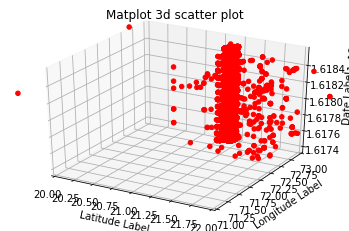

In [11]:
from mpl_toolkits.mplot3d import axes3d
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax = fig.gca(projection='3d')
my_cmap = plt.get_cmap('hsv')
dates = set(dates_list)

x = df.Latitude
y = df.Longitude
z = df.Date
plt.xlim([20, 22])
plt.ylim([71, 73])
ax.scatter(np.asarray(x, dtype = "float"), np.asarray(y, dtype = "float"), np.asarray(z, dtype = "float"), c='red')
plt.title('Matplot 3d scatter plot')
# plt.legend(loc=2)

ax.set_xlabel('Latitude Label')
ax.set_ylabel('Longitude Label')
ax.set_zlabel('Date Label')

plt.show()

In [12]:
!pip install dtw-python

     |████████████████████████████████| 583kB 6.5MB/s 


In [10]:
dates_list =  list(set(dataset["Date"]))
dates_list = sorted(dates_list)
def get_dates_list(dataset,date_data):
  return dataset[dataset.Date == date_data]
print(get_dates_list(dataset,dates_list[0]))

           Date   Latitude  Longitude
0    2021-04-03  21.223025  72.808018
1    2021-04-03  21.169480  72.790440
2    2021-04-03  21.195021  72.798539
3    2021-04-03  21.134580  72.772360
4    2021-04-03  21.166400  72.814610
...         ...        ...        ...
2308 2021-04-03  21.222094  72.896453
2309 2021-04-03  21.154161  72.842467
2310 2021-04-03  21.139207  72.769546
2311 2021-04-03  21.150844  72.836517
2312 2021-04-03  21.168328  72.833847

[2313 rows x 3 columns]


In [18]:
date_list1 = get_dates_list(df,dates_list[0])
print(len(date_list1))
date_list2 = get_dates_list(df,dates_list[1])
count = 0
print(date_list1)
list_common = []
for i in range(len(date_list1)):
  (lat,long) = (date_list1["Latitude"].iloc[i],date_list1["Longitude"].iloc[i])
  for j in range(len(date_list2)):
    (lat1,long1) = (date_list2["Latitude"].iloc[j],date_list2["Longitude"].iloc[j])
    if lat1 == lat and long == long1:
      count = count + 1
      list_common.append((i,j))
print(count)
print(list_common)

2313
           Date   Latitude  Longitude
0    2021-04-03  21.223025  72.808018
1    2021-04-03  21.169480  72.790440
2    2021-04-03  21.195021  72.798539
3    2021-04-03  21.134580  72.772360
4    2021-04-03  21.166400  72.814610
...         ...        ...        ...
2308 2021-04-03  21.222094  72.896453
2309 2021-04-03  21.154161  72.842467
2310 2021-04-03  21.139207  72.769546
2311 2021-04-03  21.150844  72.836517
2312 2021-04-03  21.168328  72.833847

[2313 rows x 3 columns]
483
[(8, 2042), (101, 1068), (101, 1276), (107, 1990), (109, 1068), (109, 1276), (111, 1990), (113, 1068), (113, 1276), (117, 24), (126, 492), (126, 498), (126, 2064), (127, 492), (127, 498), (127, 2064), (128, 663), (133, 75), (133, 2160), (133, 2162), (133, 2163), (134, 598), (143, 1698), (149, 1730), (149, 1735), (151, 1372), (151, 1384), (161, 1068), (161, 1276), (171, 665), (171, 1424), (180, 1463), (190, 528), (190, 535), (190, 560), (190, 668), (190, 1468), (190, 2161), (193, 2117), (197, 1995), (201, 

In [8]:
def cmap_discretize(cmap, N):
    """Return a discrete colormap from the continuous colormap cmap.
    
        cmap: colormap instance, eg. cm.jet. 
        N: number of colors.
    """
    if type(cmap) == str:
        cmap = get_cmap(cmap)
    colors_i = np.concatenate((np.linspace(0, 1., N), (0.,0.,0.,0.)))
    colors_rgba = cmap(colors_i)
    indices = np.linspace(0, 1., N+1)
    cdict = {}
    for ki, key in enumerate(('red','green','blue')):
        cdict[key] = [(indices[i], colors_rgba[i-1,ki], colors_rgba[i,ki]) for i in range(N+1)]
    # Return colormap object.
    return matplotlib.colors.LinearSegmentedColormap(cmap.name + "_%d"%N, cdict, 1024)

In [9]:
from pylab import rcParams
%matplotlib inline
colors = plt.get_cmap('jet')(np.linspace(0.0, 2.0, 50))
color_cluster = ['b','g','r','c','m','y','tab:brown','tab:pink','tab:purple','lime','sandybrown','peru','orangered','maroon','teal','thistle']
# colors = cmap_discretize(matplotlib.cm.jet, 50)
rcParams['figure.figsize'] = (25,20)

def plot_map(df,label_hdb,clustername_date):
  print("df")
  print(df)
  llong =72.700080 
  ulong= 72.920030
  llat = 21.063280
  ulat = 21.306330
  # my_map = Basemap(projection='merc',
  #             resolution = 'l', area_thresh = 500.0,
  #             llcrnrlon=llong, llcrnrlat=llat, #min longitude (llcrnrlon) and latitude (llcrnrlat)
  #             urcrnrlon=ulong, urcrnrlat=ulat) #max longitude (urcrnrlon) and latitude (urcrnrlat)
  # xs,ys = mymap(np.asarray(dataset["Longitude"]),np.asarray(dataset["Latitude"]))
  mymap = Basemap(projection="merc",resolution='c',llcrnrlon=llong,llcrnrlat=llat,urcrnrlon=ulong,urcrnrlat=ulat)
  mymap.drawcoastlines()
  mymap.drawcountries()
  #my_map.drawmapboundary()
  #my_map.fillcontinents(color = 'white', alpha = 0.3)
  mymap.drawlsmask(land_color='orange', ocean_color='skyblue')
  #my_map.shadedrelief()
  #my_map.bluemarble()
  #my_map.shadedrelief()
  mymap.etopo()
  xs,ys = mymap(np.asarray(df["Longitude"]),np.asarray(df["Latitude"]))
  df['xm']=xs.tolist()
  df['ym']=ys.tolist()
  # To create a color map
  
  # dataset['xm']=xs.tolist()
  # dataset['ym']=ys.tolist()

  #Visualization1
  for clust_number in set(label_hdb):
      if clust_number == -1:
        c='grey'
      else:
        c = colors[np.int(clust_number)] 
      # c=(([0.0,0.0,0.0]) if clust_number == -1 else colors[np.int(clust_number)])
      clust_set = df[df.clus_hdb_labels == clust_number]  
      print(len(clust_set))                  
      mymap.scatter(clust_set.xm, clust_set.ym, color = c , marker='o', s= 40, alpha = 0.65)
      if clust_number != -1:
          cenx=np.mean(clust_set.xm) 
          ceny=np.mean(clust_set.ym) 

          plt.text(cenx,ceny,str(clust_number), fontsize=30, color='red',)
          print ("Cluster "+str(clust_number) + ", data points "+ str(len(clust_set)))
        
  plt.savefig("etopo_cluster.png", dpi=300)

In [10]:
#applying the dbscan algorithm for the first date and seeing what the clustering would be and comparing the results with the 
#hdbscan
def dbscan_algo(df_dates,epsilon):
  covid_df_date = df_dates[["Latitude","Longitude"]]
  # df_dates = StandardScaler().fit_transform(covid_df_date)
  eps_rad = 32 / 6371.0088 #convert to radians
  print("eps_rad "+str(eps_rad))
  db_scan = DBSCAN(eps=epsilon,min_samples=50,algorithm='ball_tree', metric='haversine').fit(np.radians(covid_df_date))
  labels = db_scan.labels_
  print(labels)
  print(set(labels))
  return db_scan,labels

2313
eps_rad 0.005022752440712372
eps_rad 0.005022752440712372
[0 0 0 ... 0 2 2]
{0, 1, 2, -1}
df
           Date   Latitude  Longitude  clus_hdb_labels
0    2021-04-03  21.223025  72.808018                0
1    2021-04-03  21.169480  72.790440                0
2    2021-04-03  21.195021  72.798539                0
3    2021-04-03  21.134580  72.772360                0
4    2021-04-03  21.166400  72.814610                0
...         ...        ...        ...              ...
2308 2021-04-03  21.222094  72.896453                1
2309 2021-04-03  21.154161  72.842467                2
2310 2021-04-03  21.139207  72.769546                0
2311 2021-04-03  21.150844  72.836517                2
2312 2021-04-03  21.168328  72.833847                2

[2313 rows x 4 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the doc

1166
Cluster 0, data points 1166
856
Cluster 1, data points 856
92
Cluster 2, data points 92
199


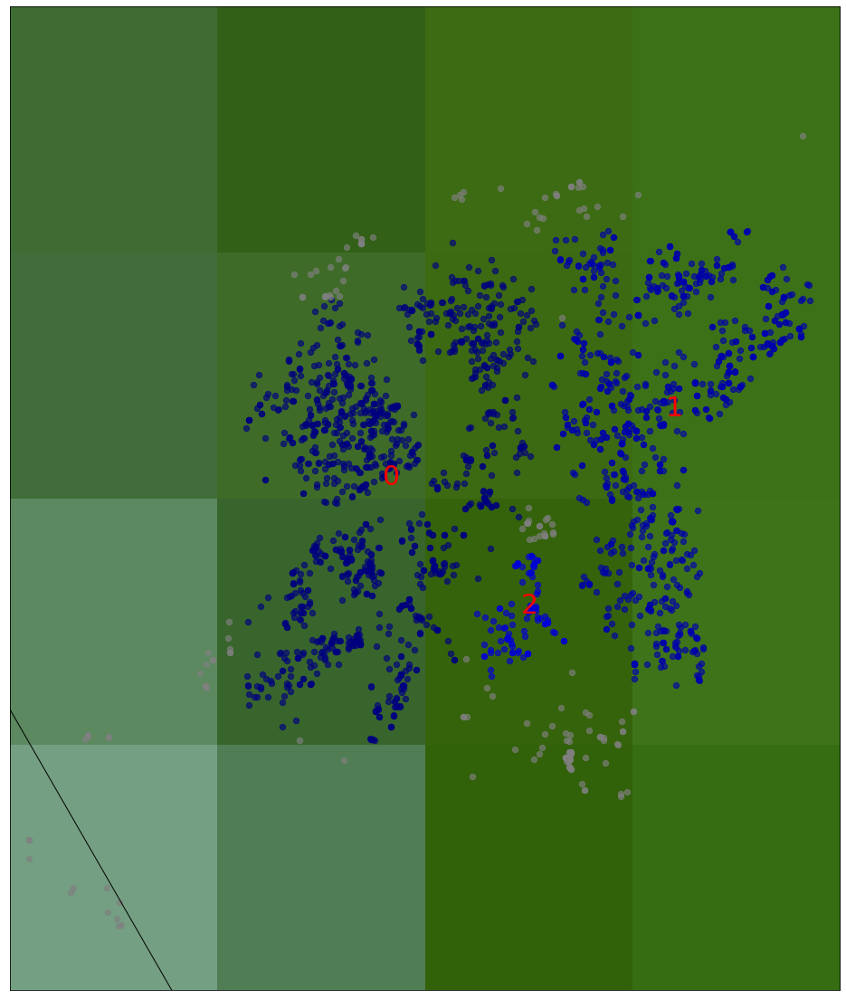

In [11]:
df_date = get_dates_list(df,dates_list[0])
print(len(df_date))
earth_radius = 6371
eps_rad = 32 / 6371.0088 #convert to radians
print("eps_rad "+str(eps_rad))
epsilon = 0.00018  #calculate 5 meter epsilon threshold
db_scan_model, db_labels = dbscan_algo(df_date,epsilon)
joblib.dump(db_scan_model, "db_scan.pkl")

df_date["clus_hdb_labels"] = db_labels

label_db = list(set(db_labels))
# realclustername_date = len(set(labels_hdb))-(1 if -1 in labels_hdb else 0)
clustername_date = len(set(label_db))

plot_map(df_date,label_db,clustername_date)
plt.show()

In [12]:
def hdbscan_model(df):
  blobs = df[["Latitude","Longitude"]]
  # blobs = StandardScaler().fit_transform((blobs))
  hdb = HDBSCAN(min_samples=50,metric= 'haversine',gen_min_span_tree=True).fit(np.radians(blobs))
  hdb_labels = hdb.labels_
  print("The validation score is " + str(hdb.relative_validity_))
  # hdb.condensed_tree_.plot()
  return hdb_labels

In [13]:
help(DBSCAN)

Help on class DBSCAN in module sklearn.cluster._dbscan:

class DBSCAN(sklearn.base.ClusterMixin, sklearn.base.BaseEstimator)
 |  DBSCAN(eps=0.5, min_samples=5, metric='euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None)
 |  
 |  Perform DBSCAN clustering from vector array or distance matrix.
 |  
 |  DBSCAN - Density-Based Spatial Clustering of Applications with Noise.
 |  Finds core samples of high density and expands clusters from them.
 |  Good for data which contains clusters of similar density.
 |  
 |  Read more in the :ref:`User Guide <dbscan>`.
 |  
 |  Parameters
 |  ----------
 |  eps : float, default=0.5
 |      The maximum distance between two samples for one to be considered
 |      as in the neighborhood of the other. This is not a maximum bound
 |      on the distances of points within a cluster. This is the most
 |      important DBSCAN parameter to choose appropriately for your data set
 |      and distance function.
 |  
 |  min_sample

2313
The validation score is 0.2680659290325375
df
           Date   Latitude  Longitude  clus_hdb_labels
0    2021-04-03  21.223025  72.808018                4
1    2021-04-03  21.169480  72.790440               10
2    2021-04-03  21.195021  72.798539                6
3    2021-04-03  21.134580  72.772360               -1
4    2021-04-03  21.166400  72.814610               -1
...         ...        ...        ...              ...
2308 2021-04-03  21.222094  72.896453                3
2309 2021-04-03  21.154161  72.842467                1
2310 2021-04-03  21.139207  72.769546               -1
2311 2021-04-03  21.150844  72.836517                1
2312 2021-04-03  21.168328  72.833847               -1

[2313 rows x 4 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


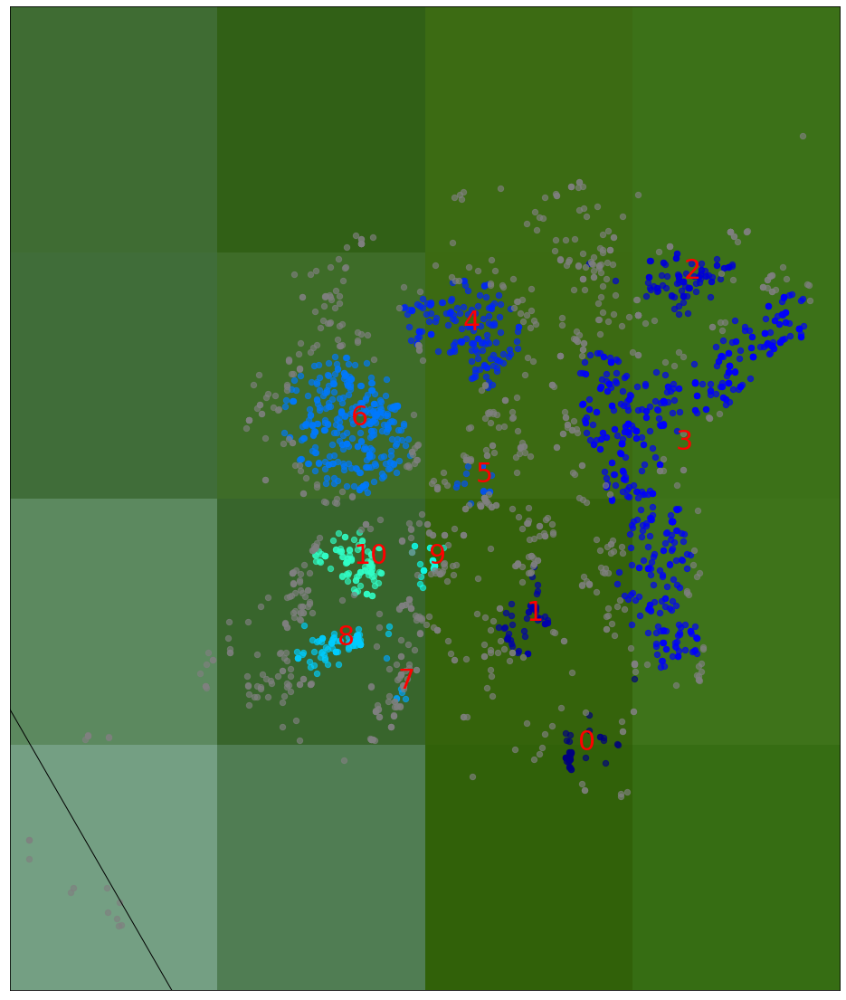

In [14]:
df_date = get_dates_list(df,dates_list[0])
print(len(df_date))
earth_radius = 6371
epsilon = 0.00018  #calculate 5 meter epsilon threshold
hdb_labels = hdbscan_model(df_date)

df_date["clus_hdb_labels"] = hdb_labels

label_hdb = list(set(hdb_labels))
# realclustername_date = len(set(labels_hdb))-(1 if -1 in labels_hdb else 0)
clustername_date = len(set(hdb_labels))

plot_map(df_date,hdb_labels,clustername_date)
plt.show()

In [15]:
#silhoute score of the hdbscan
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(np.radians(df_date[["Latitude","Longitude"]]), hdb_labels))
#as the result speaks for itself this clustering is not proper


Silhouette Coefficient: -0.132


In [16]:
#plotting the growth of the particular cluster depending upon the cluster number 
#it is just for observation purpose
#silhoutte score
print(np.radians(df_date[["Latitude","Longitude"]]).shape)
print(len(label_db))
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(np.radians(df_date[["Latitude","Longitude"]]), db_labels, metric='haversine'))

(2313, 2)
4
Silhouette Coefficient: 0.139


In [17]:
#hdscan with the dbscan 
def hdbscan_model_epsilon(df,epsilon):
  blobs = df[["Latitude","Longitude"]]
  print(type(blobs))
  # blobs = StandardScaler().fit_transform(blobs)
  hdb = HDBSCAN(min_cluster_size = 50, min_samples=10,
                gen_min_span_tree=True, metric = 'haversine',algorithm = 'best', cluster_selection_epsilon=epsilon,prediction_data = True).fit(np.radians(blobs))
  hdb_labels = hdb.labels_
  print("The relative validtiy of the clustering is " + str(hdb.relative_validity_ ))
  # hdb.condensed_tree_.plot()
  return hdb, hdb_labels

In [18]:
help(HDBSCAN)

Help on class HDBSCAN in module hdbscan.hdbscan_:

class HDBSCAN(sklearn.base.BaseEstimator, sklearn.base.ClusterMixin)
 |  HDBSCAN(min_cluster_size=5, min_samples=None, cluster_selection_epsilon=0.0, metric='euclidean', alpha=1.0, p=None, algorithm='best', leaf_size=40, memory=Memory(location=None), approx_min_span_tree=True, gen_min_span_tree=False, core_dist_n_jobs=4, cluster_selection_method='eom', allow_single_cluster=False, prediction_data=False, match_reference_implementation=False, **kwargs)
 |  
 |  Perform HDBSCAN clustering from vector array or distance matrix.
 |  
 |  HDBSCAN - Hierarchical Density-Based Spatial Clustering of Applications
 |  with Noise. Performs DBSCAN over varying epsilon values and integrates
 |  the result to find a clustering that gives the best stability over epsilon.
 |  This allows HDBSCAN to find clusters of varying densities (unlike DBSCAN),
 |  and be more robust to parameter selection.
 |  
 |  Parameters
 |  ----------
 |  min_cluster_size : i

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.30382740e-05
  7.51452375e-05 7.58236450e-05]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64535466e-05
  7.67199826e-05 7.86028421e-05]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.66220526e-05
  7.76368533e-05 7.88269101e-05]
 ...
 [0.00000000e+00 3.13558042e-03 3.61961810e-03 ... 8.99331883e-01
  8.99331883e-01 8.99404794e-01]
 [0.00000000e+00 3.65182720e-03 4.08026995e-03 ... 8.99528223e-01
  8.99528223e-01 8.99601346e-01]
 [0.00000000e+00 1.69910232e-01 1.70065950e-01 ... 8.99832512e-01
  8.99832512e-01 8.99905963e-01]]


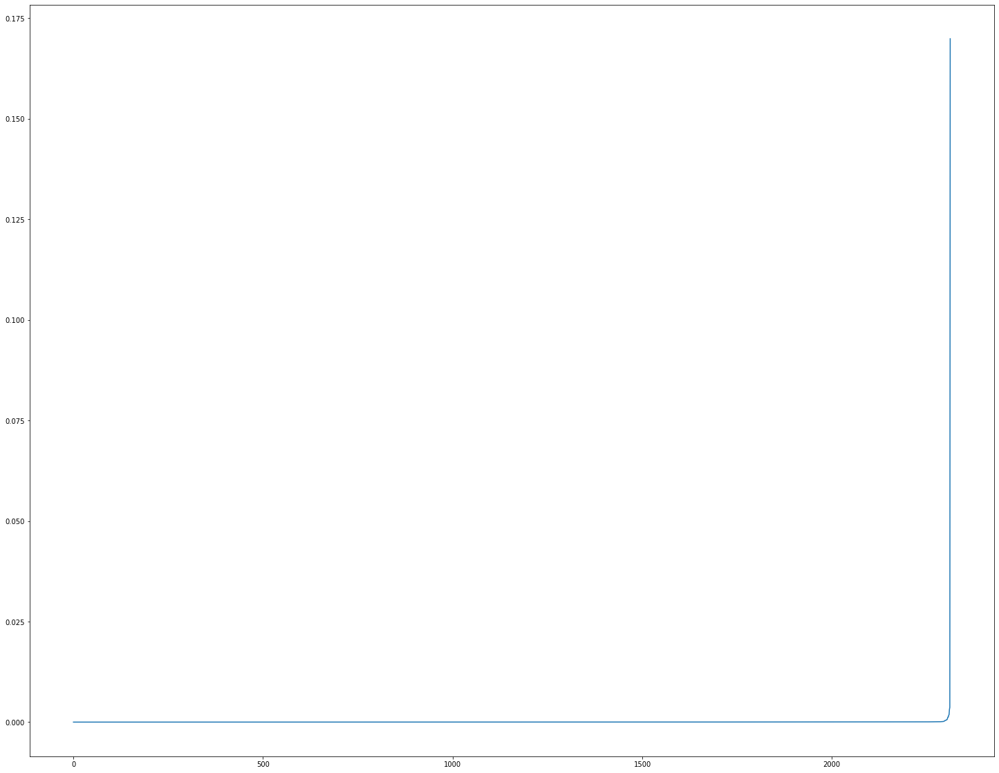

In [19]:
from sklearn.neighbors import NearestNeighbors
def optimum_eps_value(df_dates):
  neigh = NearestNeighbors(n_neighbors=50)
  nbrs = neigh.fit(np.radians(df_dates[["Latitude","Longitude"]]))
  distances, indices = nbrs.kneighbors(np.radians(df_dates[["Latitude","Longitude"]]))
  distances = np.sort(distances, axis=0)
  print(distances)
  distances = distances[:,1]
  plt.plot(distances)
  # plt.xlim(-5, 5)
  # plt.ylim(0 , .01)
optimum_eps_value(df_date)

In [20]:
print(np.radians(df[["Latitude","Longitude"]]))

       Latitude  Longitude
0      0.370412   1.270740
1      0.369477   1.270433
2      0.369923   1.270574
3      0.368868   1.270117
4      0.369423   1.270855
...         ...        ...
29134  0.370269   1.272191
29135  0.370685   1.272020
29136  0.369172   1.271044
29137  0.369475   1.271276
29138  0.369314   1.271235

[29139 rows x 2 columns]


<class 'pandas.core.frame.DataFrame'>
The relative validtiy of the clustering is 0.0
df
           Date   Latitude  Longitude  clus_hdb_labels
0    2021-04-03  21.223025  72.808018                1
1    2021-04-03  21.169480  72.790440                1
2    2021-04-03  21.195021  72.798539                1
3    2021-04-03  21.134580  72.772360                1
4    2021-04-03  21.166400  72.814610                1
...         ...        ...        ...              ...
2308 2021-04-03  21.222094  72.896453                1
2309 2021-04-03  21.154161  72.842467                1
2310 2021-04-03  21.139207  72.769546                1
2311 2021-04-03  21.150844  72.836517                1
2312 2021-04-03  21.168328  72.833847                1

[2313 rows x 4 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


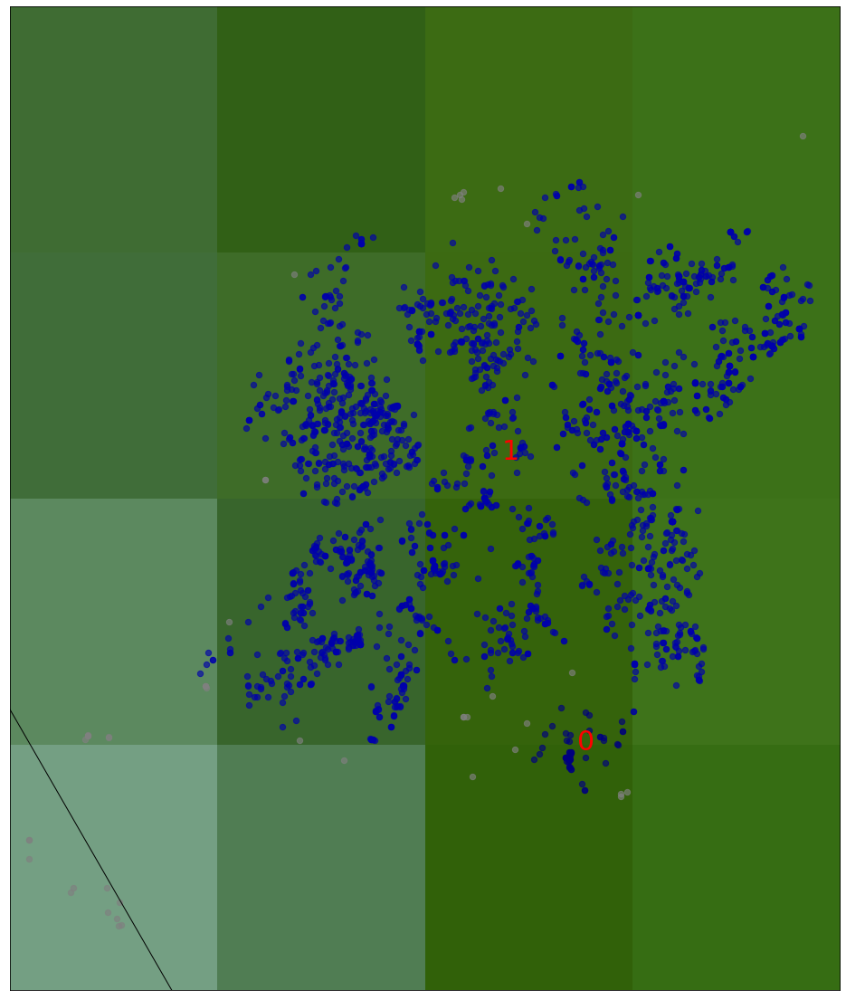

In [21]:
df_date = get_dates_list(df,dates_list[0])
# print(len(df_date))
earth_radius = 6371
epsilon = 0.00018  #calculate 5 meter epsilon threshold
hdb, hdb_labels = hdbscan_model_epsilon(df_date,epsilon)

df_date["clus_hdb_labels"] = hdb_labels

label_hdb = list(set(hdb_labels))
# realclustername_date = len(set(labels_hdb))-(1 if -1 in labels_hdb else 0)
clustername_date = len(set(hdb_labels))

plot_map(df_date,hdb_labels,clustername_date)
plt.show()

In [22]:
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(np.radians(df_date[["Latitude","Longitude"]]), hdb_labels))

Silhouette Coefficient: 0.180


In [23]:
!git clone https://github.com/christopherjenness/DBCV.git

Cloning into 'DBCV'...
remote: Enumerating objects: 133, done.
remote: Total 133 (delta 0), reused 0 (delta 0), pack-reused 133
Receiving objects: 100% (133/133), 126.04 KiB | 5.73 MiB/s, done.
Resolving deltas: 100% (45/45), done.


In [24]:
!sudo /content/DBCV/setup.py install



sudo: /content/DBCV/setup.py: command not found


In [25]:
from sklearn.metrics.pairwise import haversine_distances 
from scipy.spatial.distance import euclidean
from DBCV.DBCV import DBCV

In [26]:
#finding the increase of the cluster
# step 1: predict the model for the day one
# step 2: predict the cluster centroids for the model
# step 3: calculate the distance of all the points from these cluster centroids
# step 4: find the new centroids with the new model and see how the cluster is expanding
# step 5: visualization tasks to be defined later

#change of tasks
# step 2: predict the no of outliers
# step 3: see if the no of outliers is increasing more than threshold
# step 4: find new model


#predict the model for the second day and so on

def model_predict(df_date):
  db_scan_model = joblib.load("db_scan.pkl")
  covid_df_date  = df_date[["Latitude","Longitude"]]
  predicted_labels = db_scan_model.fit_predict(np.radians(covid_df_date))
  no_outliers = np.count_nonzero(predicted_labels == -1)

  return predicted_labels, no_outliers 





In [27]:
joblib.dump(hdb, "hdb_scan.pkl")

['hdb_scan.pkl']

In [28]:
#prediction for the forward dates


The plot for the date 2021-04-03 00:00:00
The no of outliers is 199
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


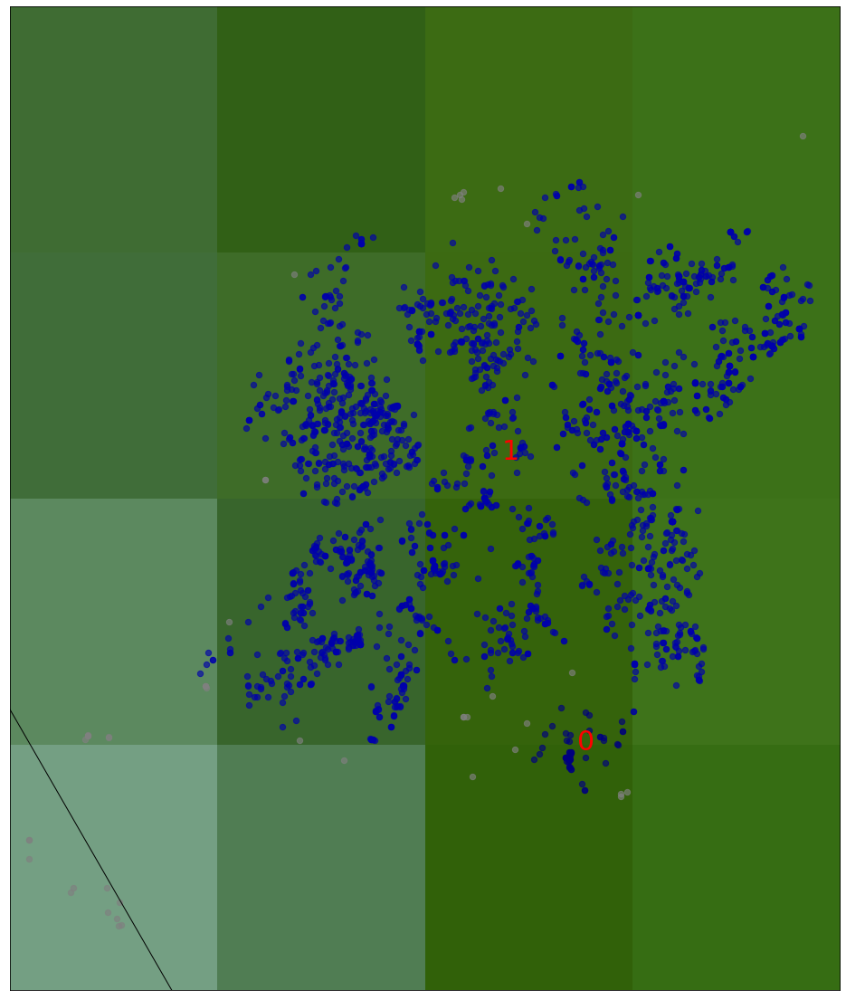

The plot for the date 2021-04-04 00:00:00
The no of outliers is 170
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


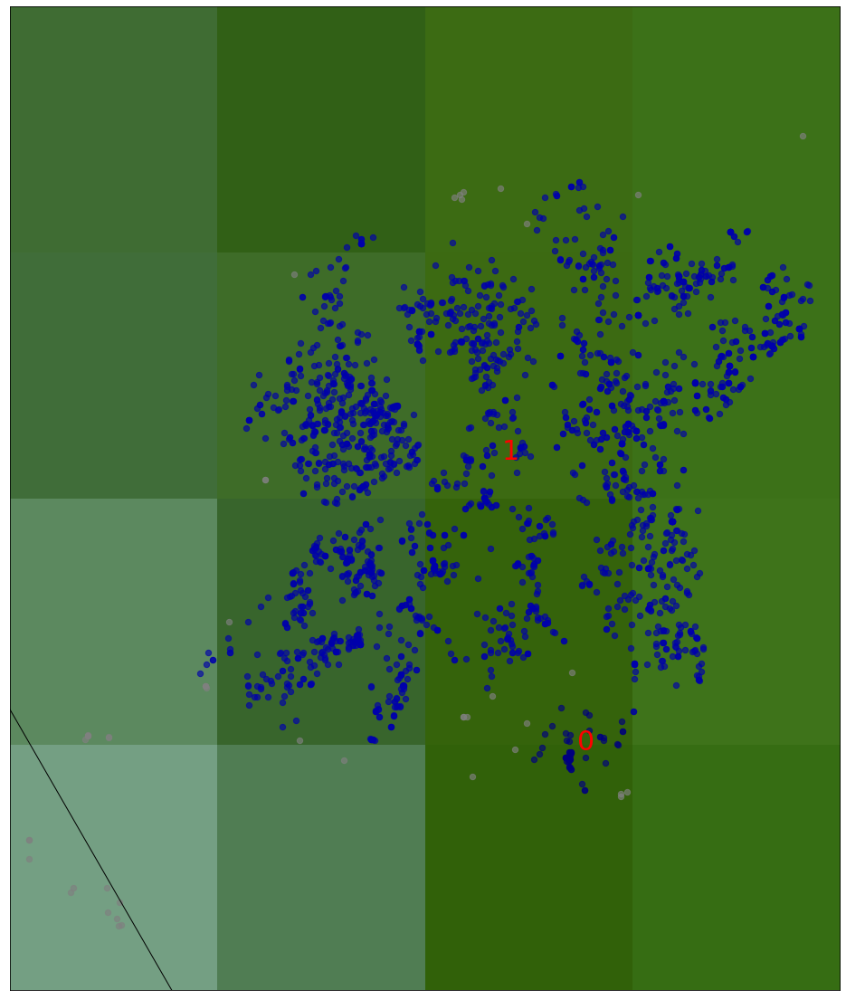

The plot for the date 2021-04-05 00:00:00
The no of outliers is 194
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


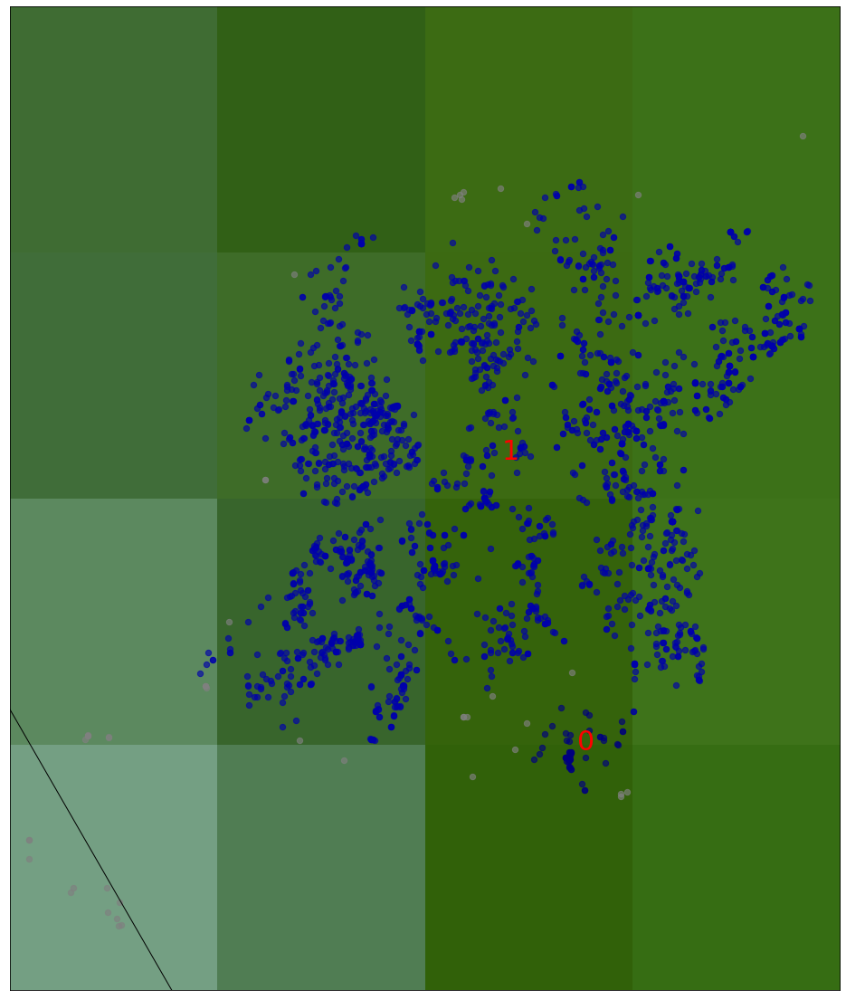

The plot for the date 2021-04-06 00:00:00
The no of outliers is 217
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


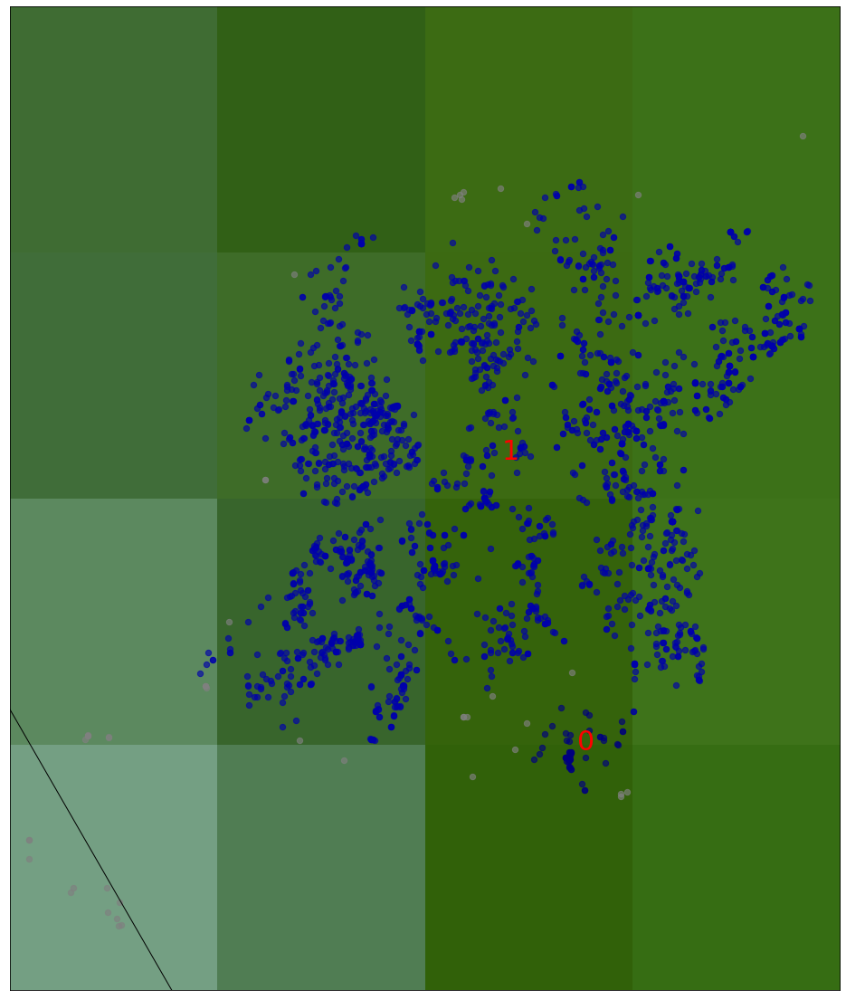

The plot for the date 2021-04-07 00:00:00
The no of outliers is 139
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


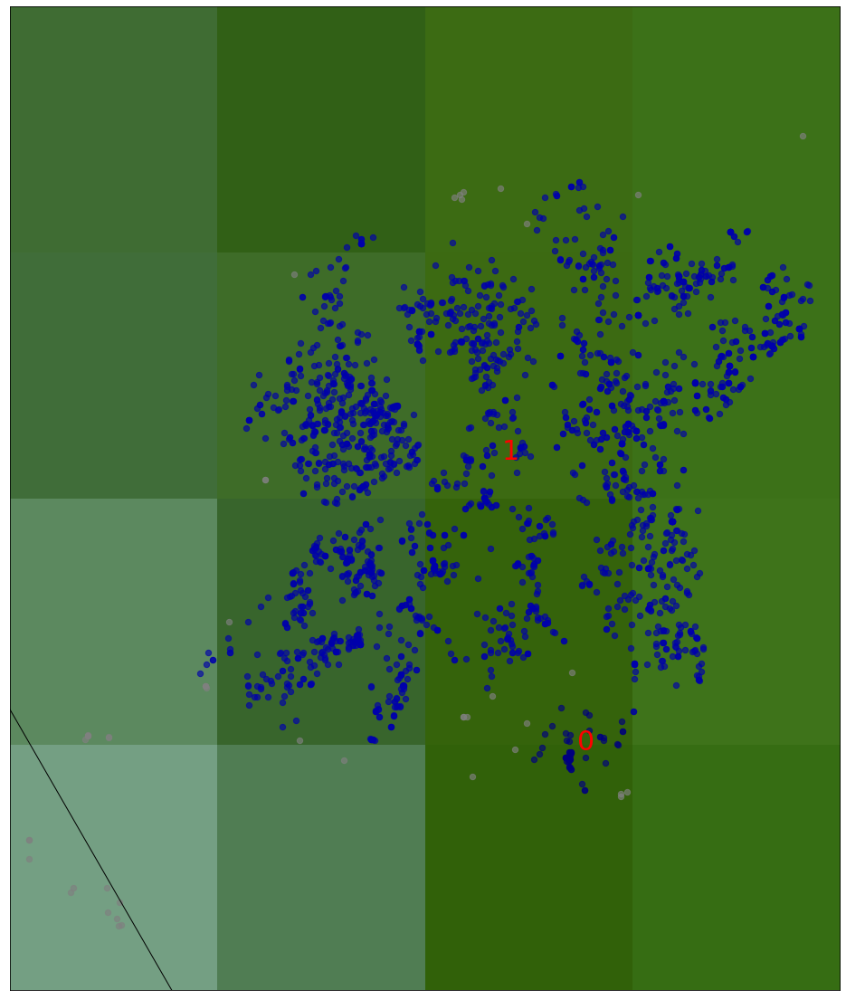

The plot for the date 2021-04-08 00:00:00
The no of outliers is 348
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


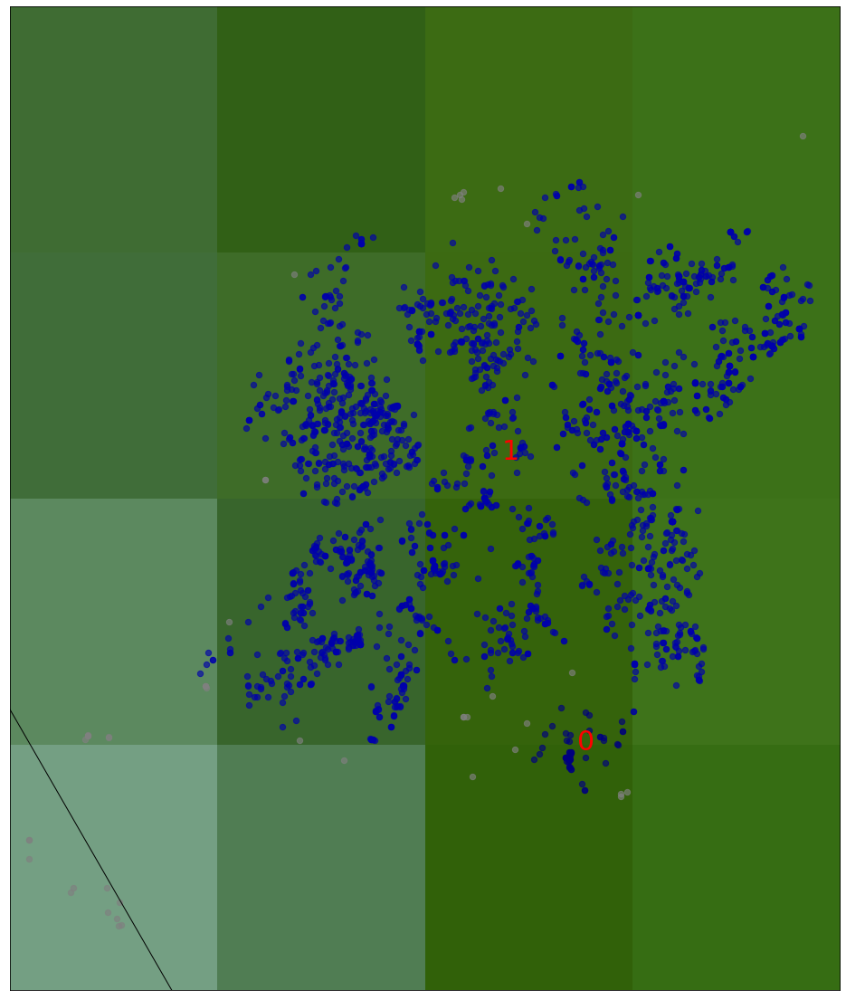

The plot for the date 2021-04-09 00:00:00
The no of outliers is 205
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


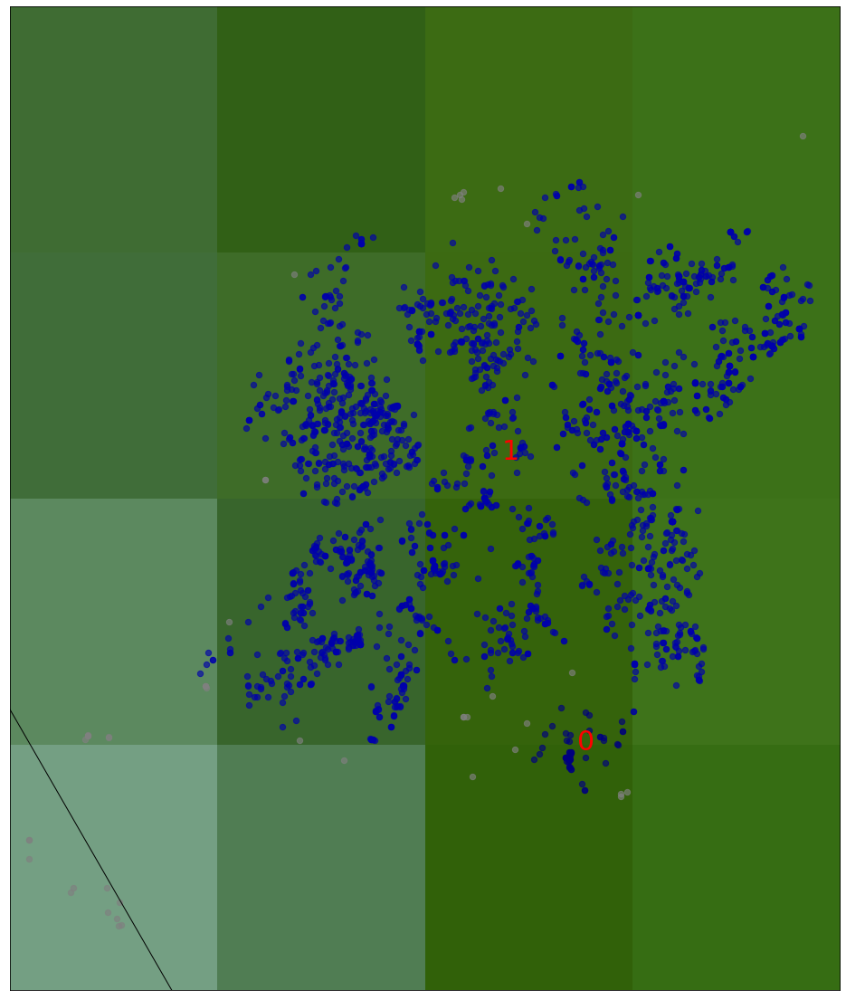

The plot for the date 2021-04-10 00:00:00
The no of outliers is 162
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


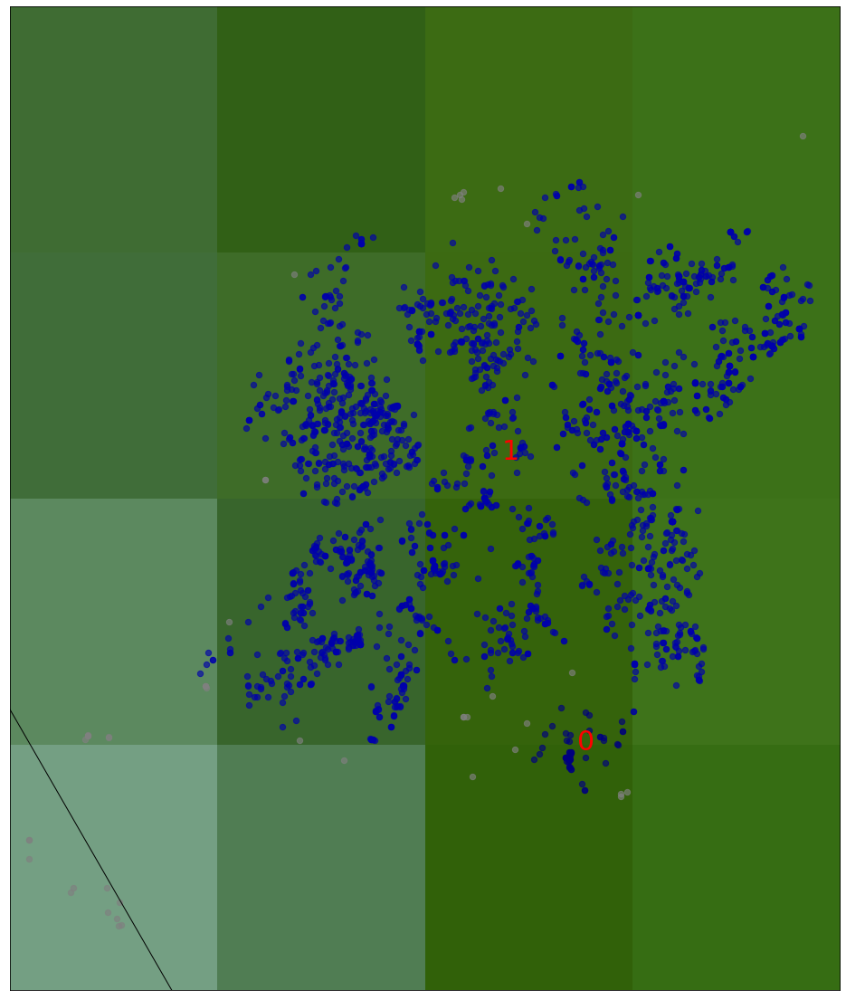

The plot for the date 2021-04-11 00:00:00
The no of outliers is 324
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


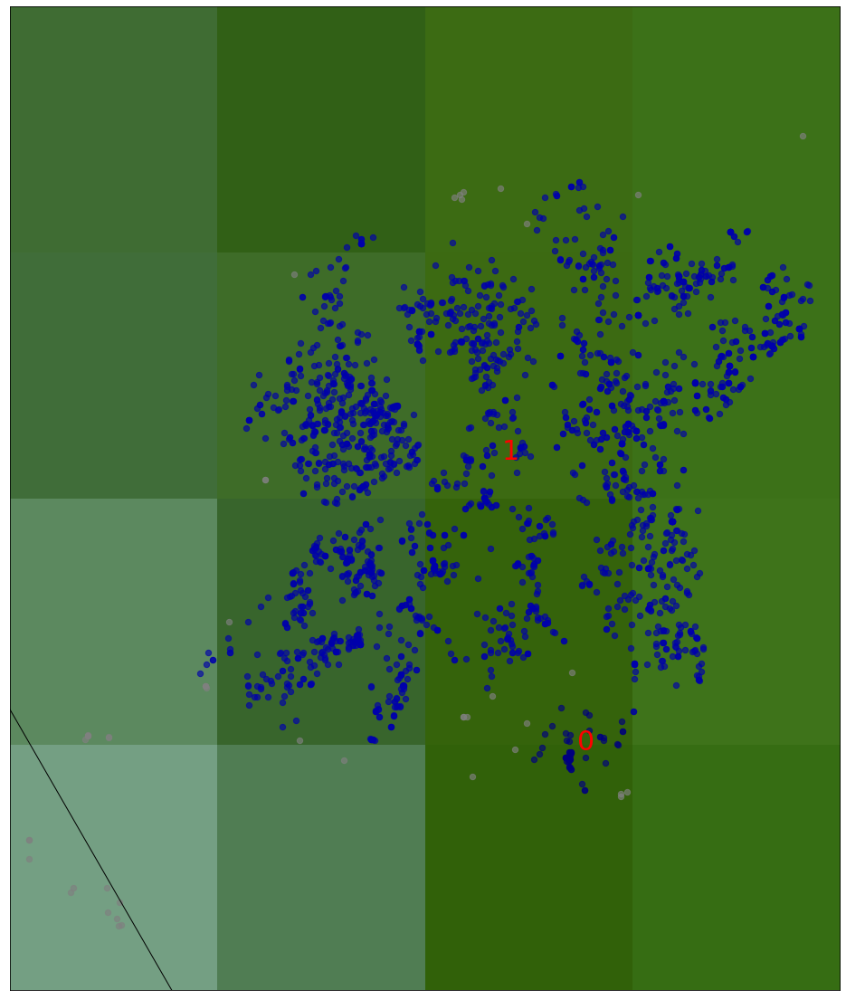

The plot for the date 2021-04-12 00:00:00
The no of outliers is 265
df


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]
54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


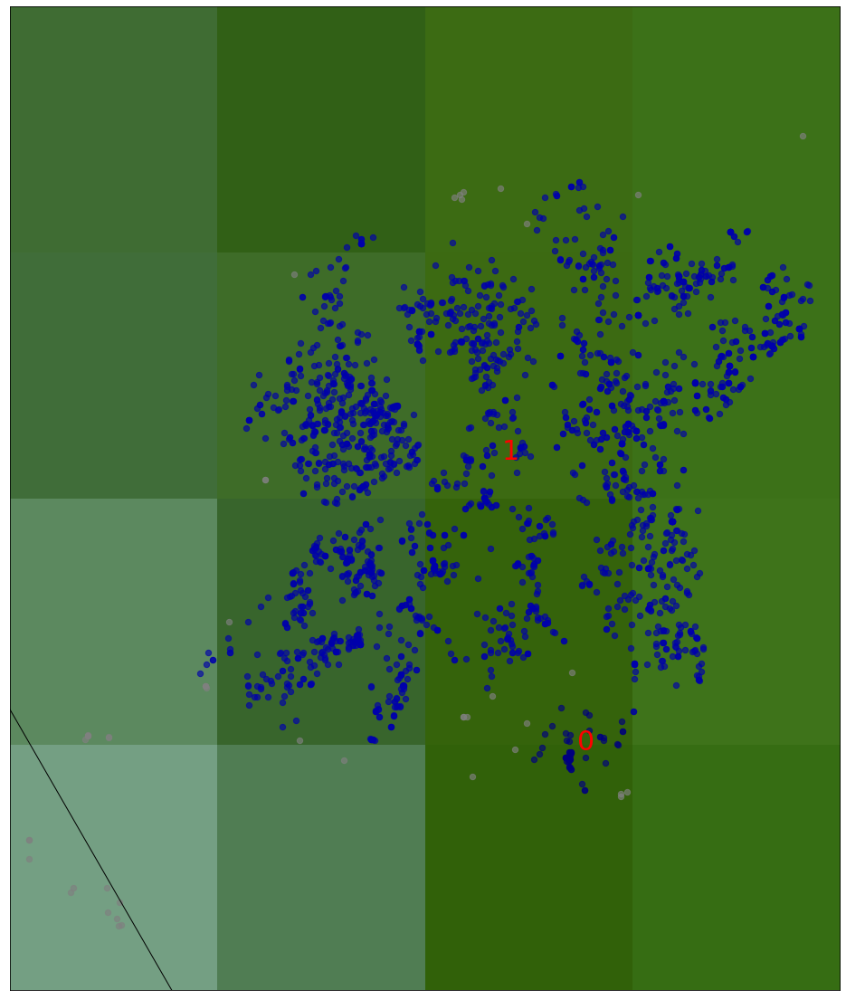

The plot for the date 2021-04-13 00:00:00
The no of outliers is 293
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


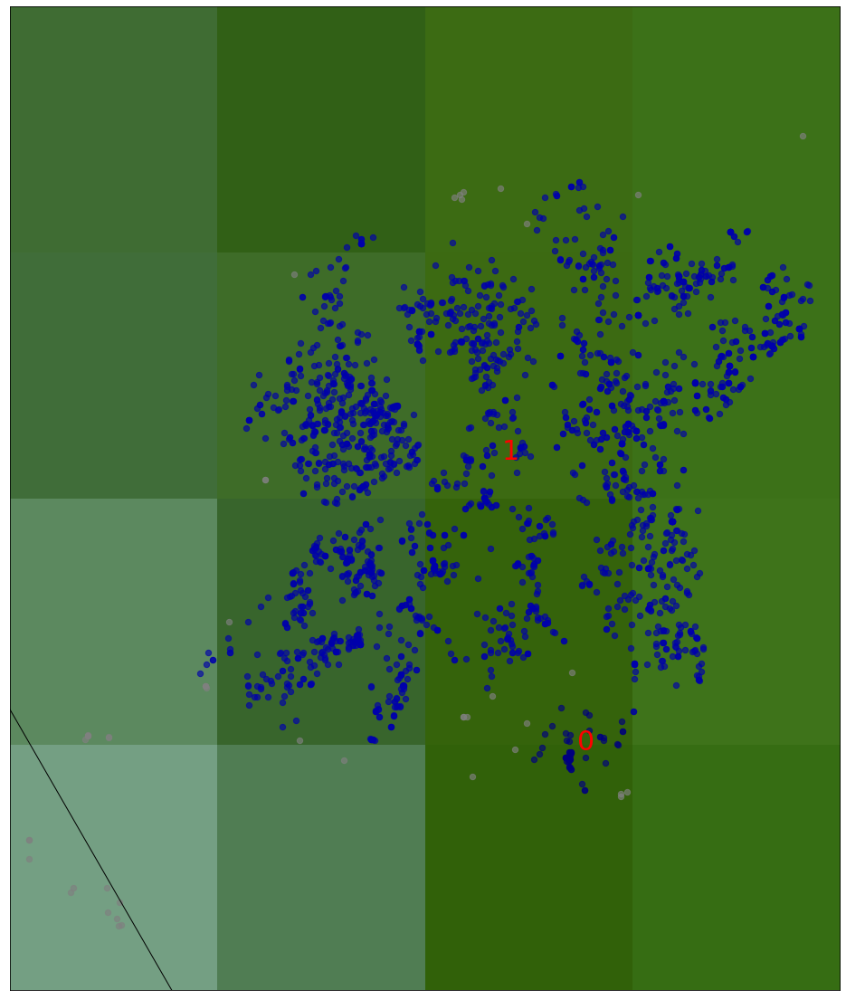

The plot for the date 2021-04-14 00:00:00
The no of outliers is 380
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


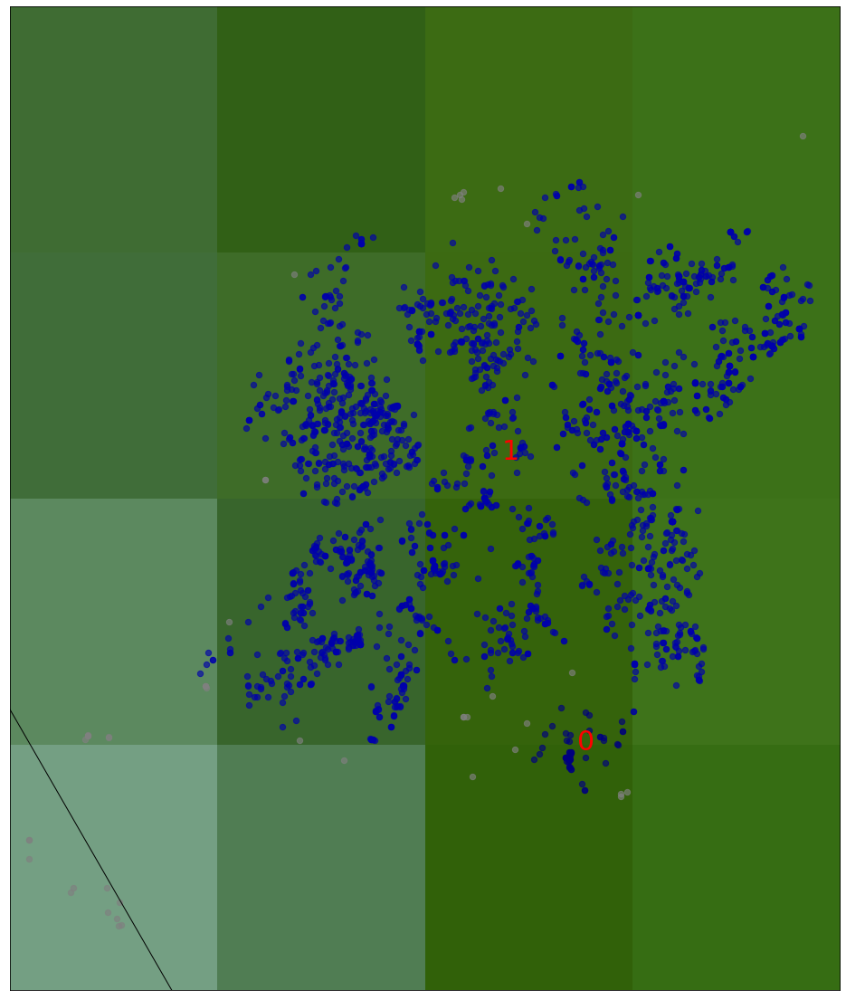

The plot for the date 2021-04-15 00:00:00
The no of outliers is 281
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


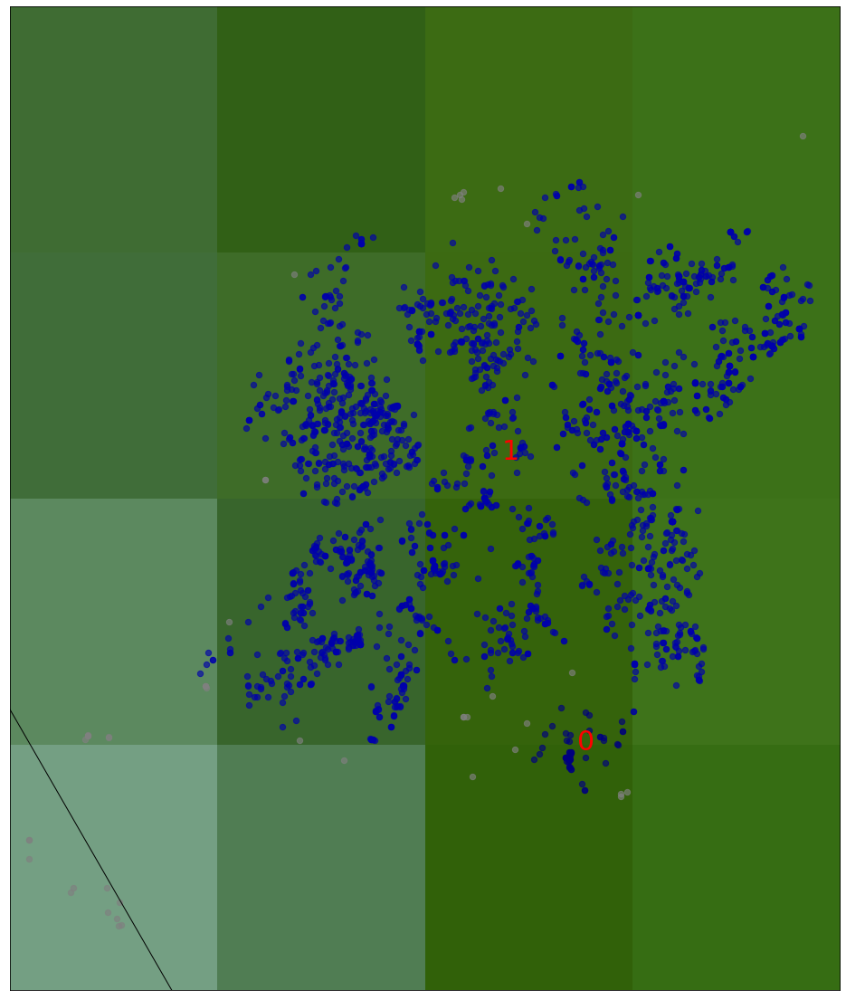

The plot for the date 2021-04-16 00:00:00
The no of outliers is 494
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
2308 2021-04-03  21.222094  ...  21835.671048  18933.840280
2309 2021-04-03  21.154161  ...  15832.704565  10832.368400
2310 2021-04-03  21.139207  ...   7724.256465   9049.469649
2311 2021-04-03  21.150844  ...  15171.050585  10436.900805
2312 2021-04-03  21.168328  ...  14874.171390  12521.560331

[2313 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


54
Cluster 0, data points 54
2192
Cluster 1, data points 2192
67


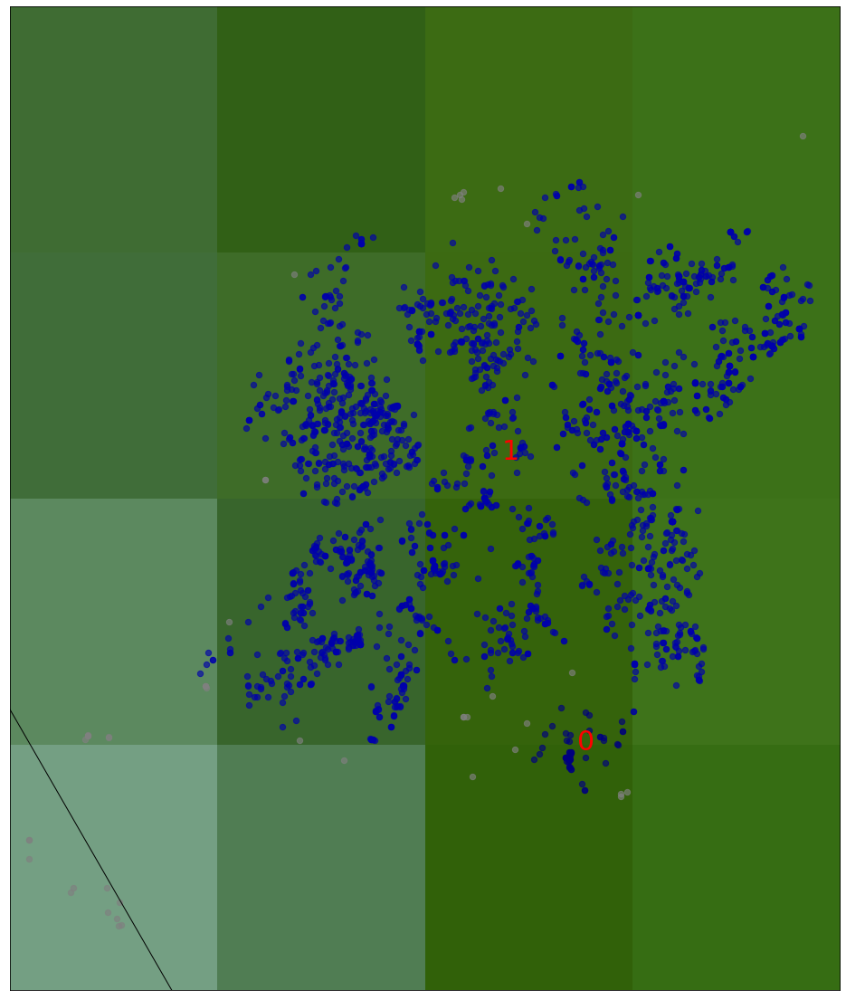

In [29]:
for dates in dates_list:
  print("The plot for the date " + str(dates))
  date_df = get_dates_list(df, dates)
  labels, no_outliers = model_predict(date_df)
  print("The no of outliers is " + str(no_outliers))
  clustername_date = len(set(labels))
  plot_map(df_date,hdb_labels,clustername_date)
  plt.show()


In [30]:
#getting the centroids and variance for each cluster 
def variance_centroids(hdb_model,cluster_len,df):
  for i in range(cluster_len):
    #first find the centroids for each cluster
    try:
      centroids = hdb_model.weighted_cluster_centroid(i)
      # print(centroids)
      distance_matrix = df[df.clus_hdb_labels == i]
      distance_matrix = np.radians(df[["Latitude","Longitude"]]).to_numpy()
      # print(distance_matrix.shape)
      distance_matrix = distance_matrix - centroids
      variance  = np.multiply(distance_matrix,distance_matrix)
      variance = np.sum(variance)
      variance = variance /len(df)
      print("variance  " +str( variance))
    except Exception as ex:
      print("Erro calculating the centroid for cluster no %i" % i)
    
    
  

In [31]:
variance_centroids(hdb,len(set(hdb_labels)),df_date)

variance  0.0024731190039858826
variance  0.0024694280827409995
Erro calculating the centroid for cluster no 2


In [32]:
import hdbscan
def get_predicted_labels(df,hdb):
  blobs = df[["Latitude","Longitude"]]
  pred_labels,_ = hdbscan.approximate_predict(hdb, np.radians(blobs))
  print(pred_labels)
  return pred_labels
  


[ 2  1  2 ...  2 -1  2]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
4553 2021-04-04  21.163619  ...           NaN           NaN
4554 2021-04-04  21.157665  ...           NaN           NaN
4555 2021-04-04  21.165650  ...           NaN           NaN
4556 2021-04-04  21.184863  ...           NaN           NaN
4557 2021-04-04  21.146249  ...           NaN           NaN

[4558 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


86
Cluster 0, data points 86
2756
Cluster 1, data points 2756
475


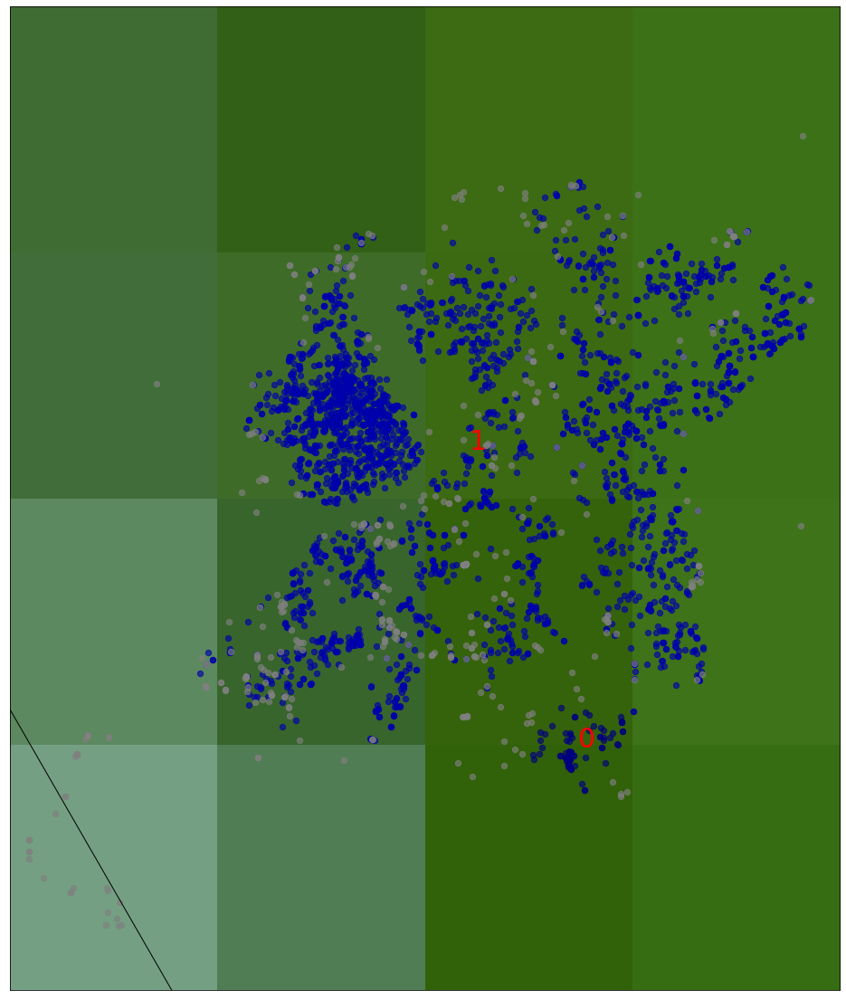

variance  0.001434779038229214
variance  0.0014319187641116046
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[2 1 1 ... 0 2 3]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
7105 2021-04-05  21.205525  ...           NaN           NaN
7106 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


103
Cluster 0, data points 103
3359
Cluster 1, data points 3359
926


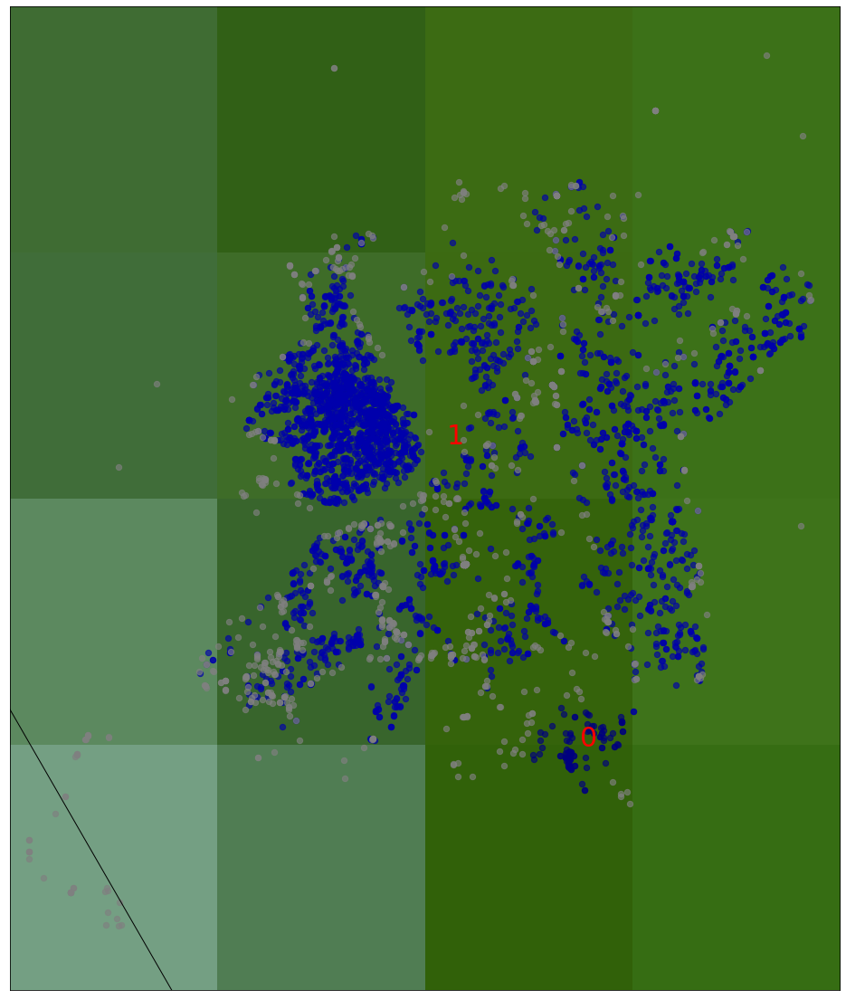

variance  0.0013878456584812584
variance  0.0013848645027574027
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[-1  3  7 ... -1 -1  2]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
9392 2021-04-06  21.243340  ...           NaN           NaN


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


137
Cluster 0, data points 137
3875
Cluster 1, data points 3875
1324


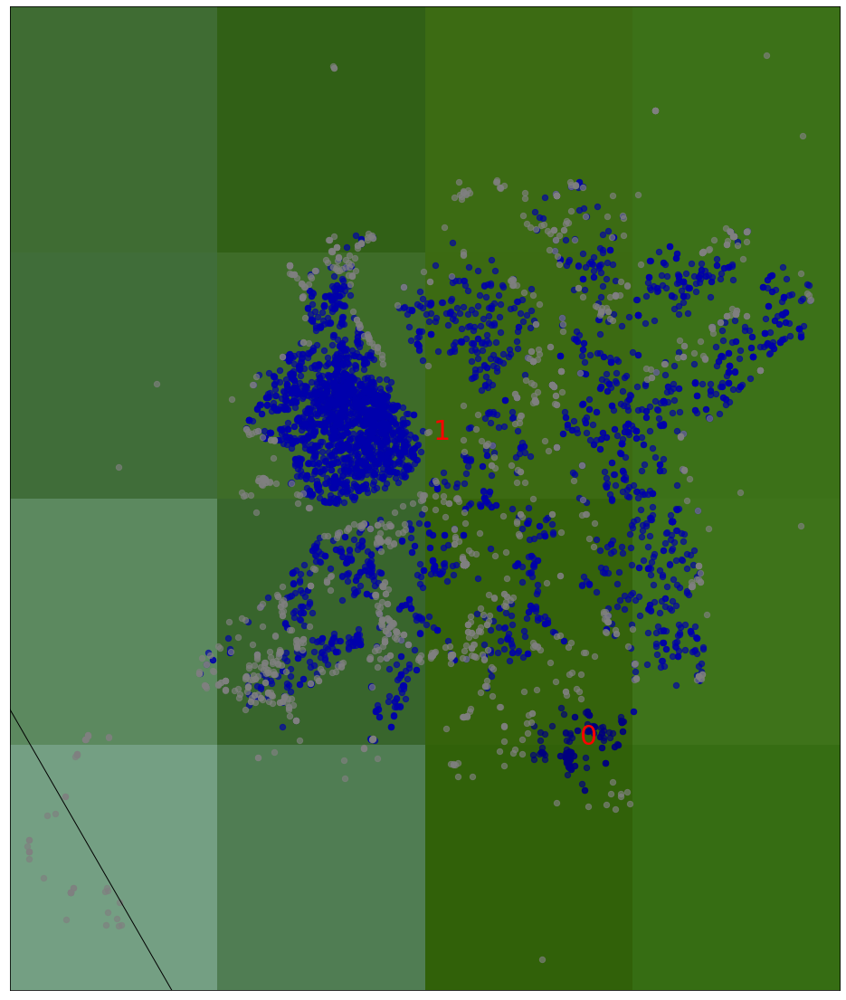

variance  0.0013141984998319112
variance  0.0013113210816660815
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 3 -1  2 ...  1  1  4]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
11685 2021-04-07  21.223986  ...           NaN       

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


161
Cluster 0, data points 161
4423
Cluster 1, data points 4423
1769


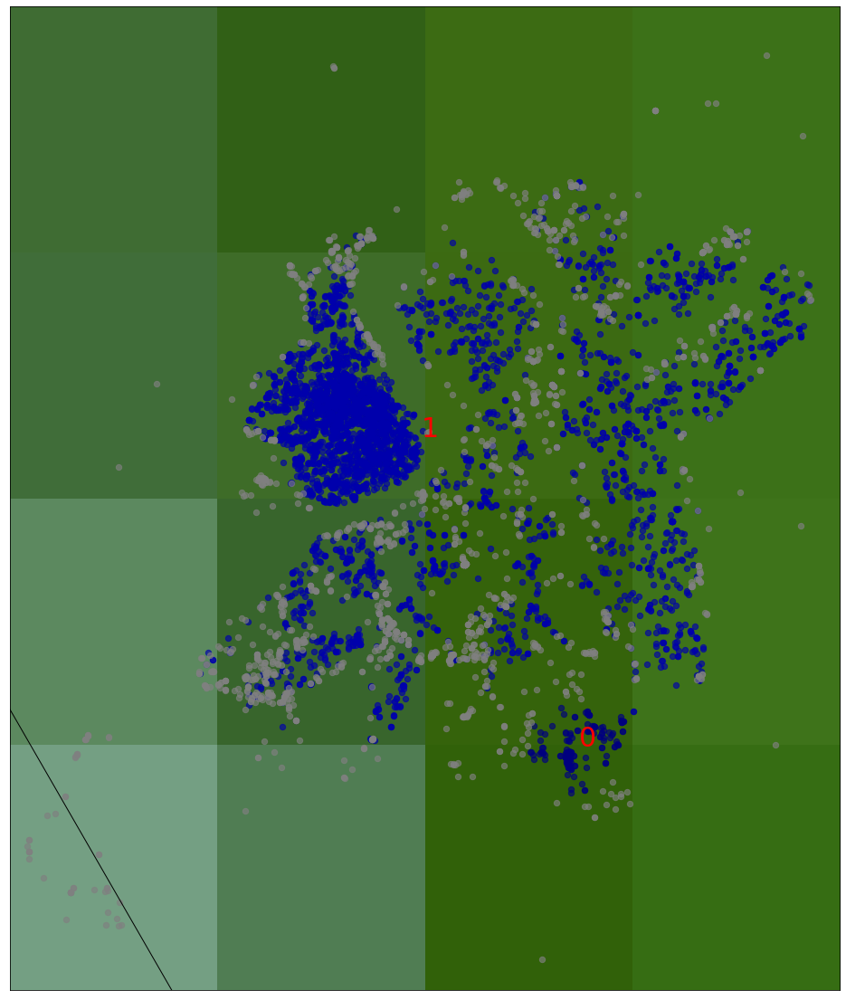

variance  0.0011959518846518498
variance  0.0011931780989365727
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[1 2 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
13870 2021-04-08  21.244172  ...           NaN           Na

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


216
Cluster 0, data points 216
4988
Cluster 1, data points 4988
2112


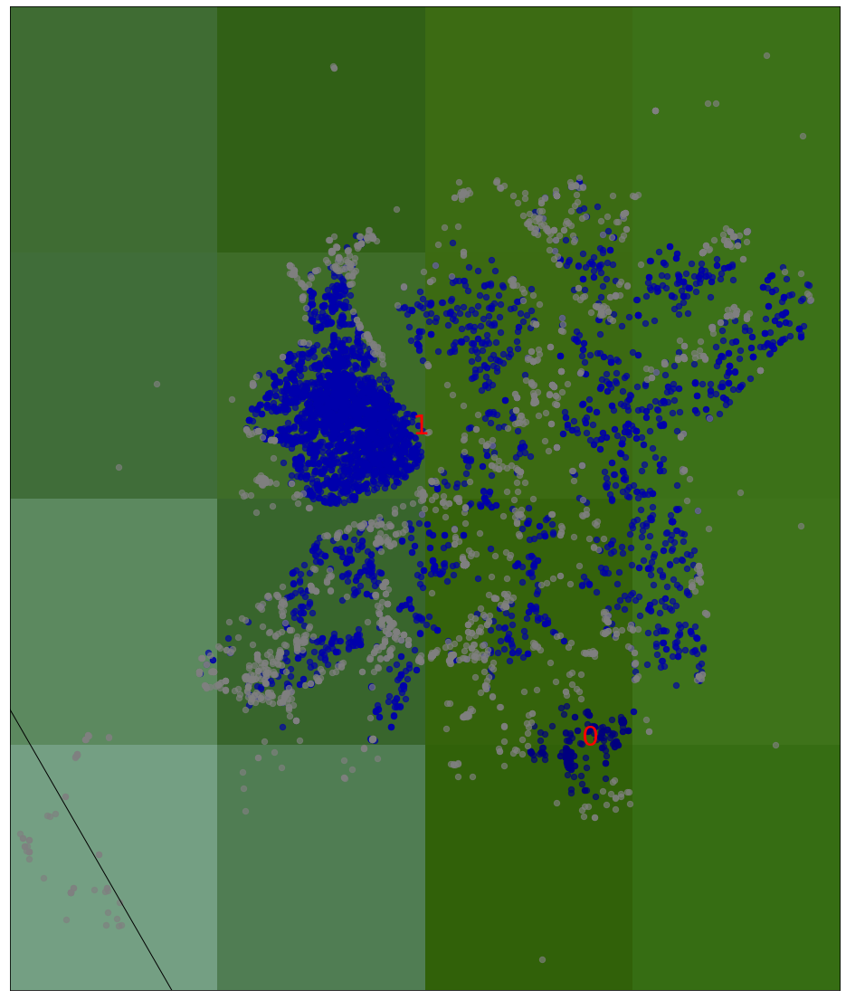

variance  0.0014180694191162553
variance  0.0014151364083701981
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[0 3 3 ... 6 3 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
16139 2021-04-09  21.223474  ...           NaN           Na

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


250
Cluster 0, data points 250
5415
Cluster 1, data points 5415
2521


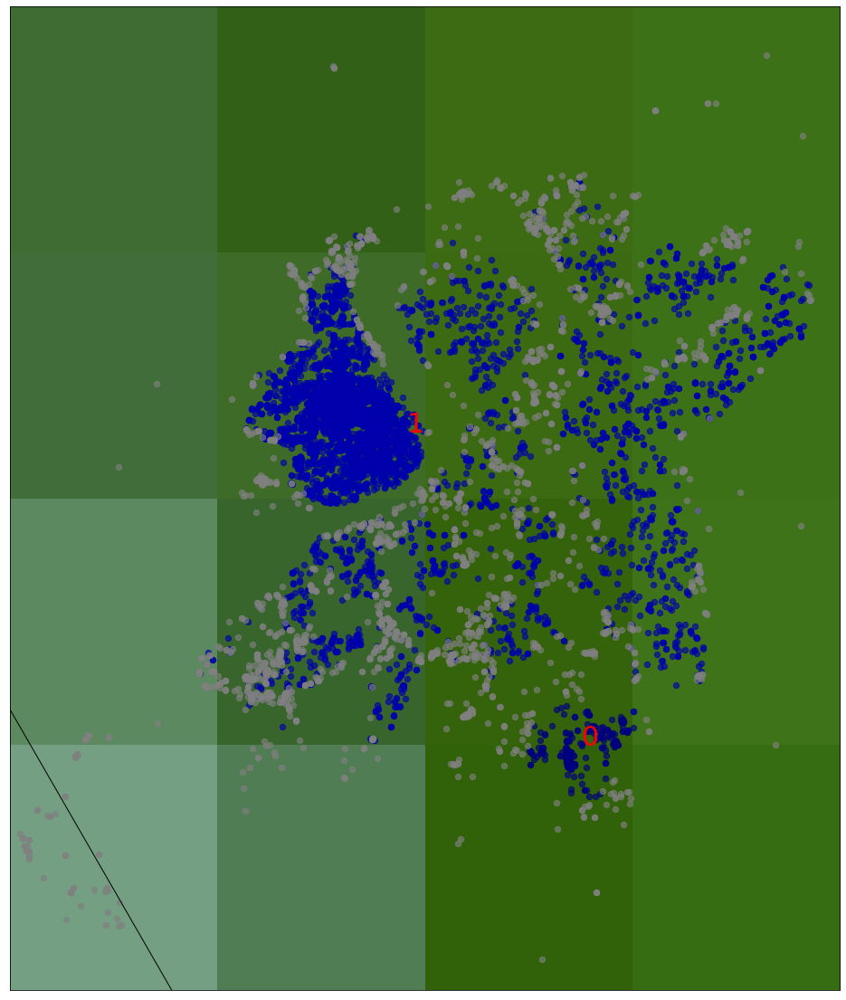

variance  0.0014711767692349468
variance  0.0014679864376441103
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 2  7  3 ... -1  4  0]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
18982 2021-04-10  21.219969  ...           NaN       

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


276
Cluster 0, data points 276
5866
Cluster 1, data points 5866
3109


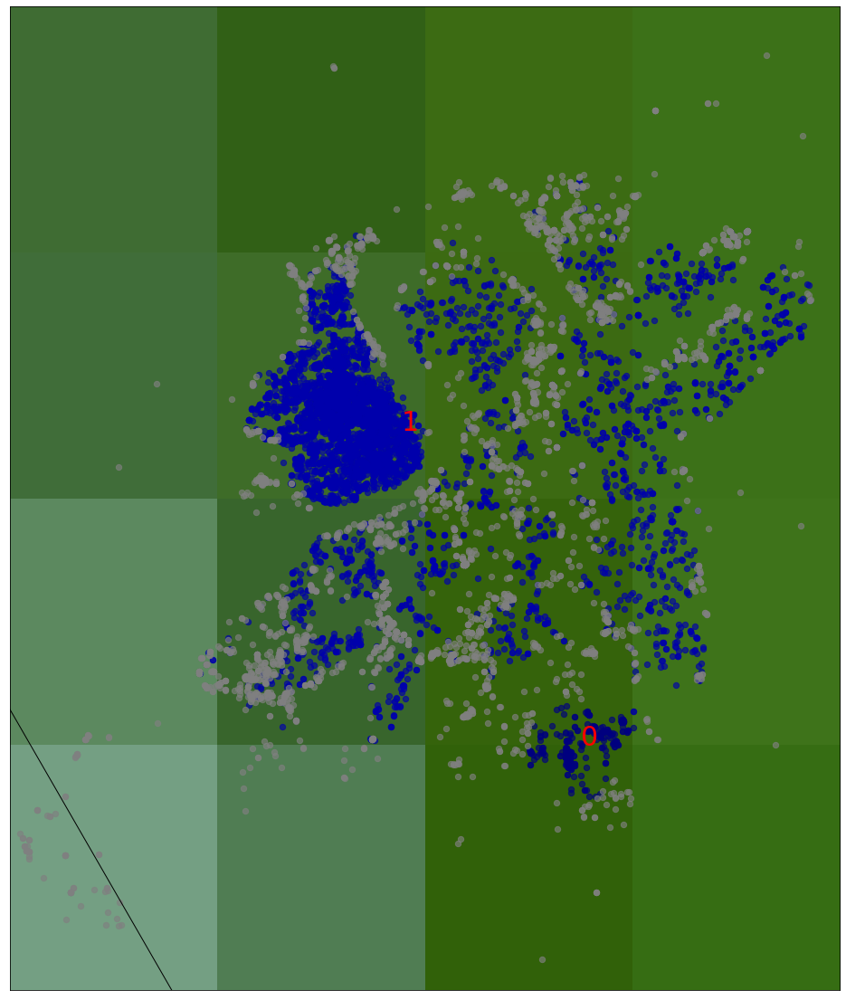

variance  0.0014691515515754927
variance  0.0014659455423986262
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 3  4  4 ...  1 -1  9]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
21106 2021-04-11  21.221817  ...           NaN       

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


303
Cluster 0, data points 303
6188
Cluster 1, data points 6188
3556


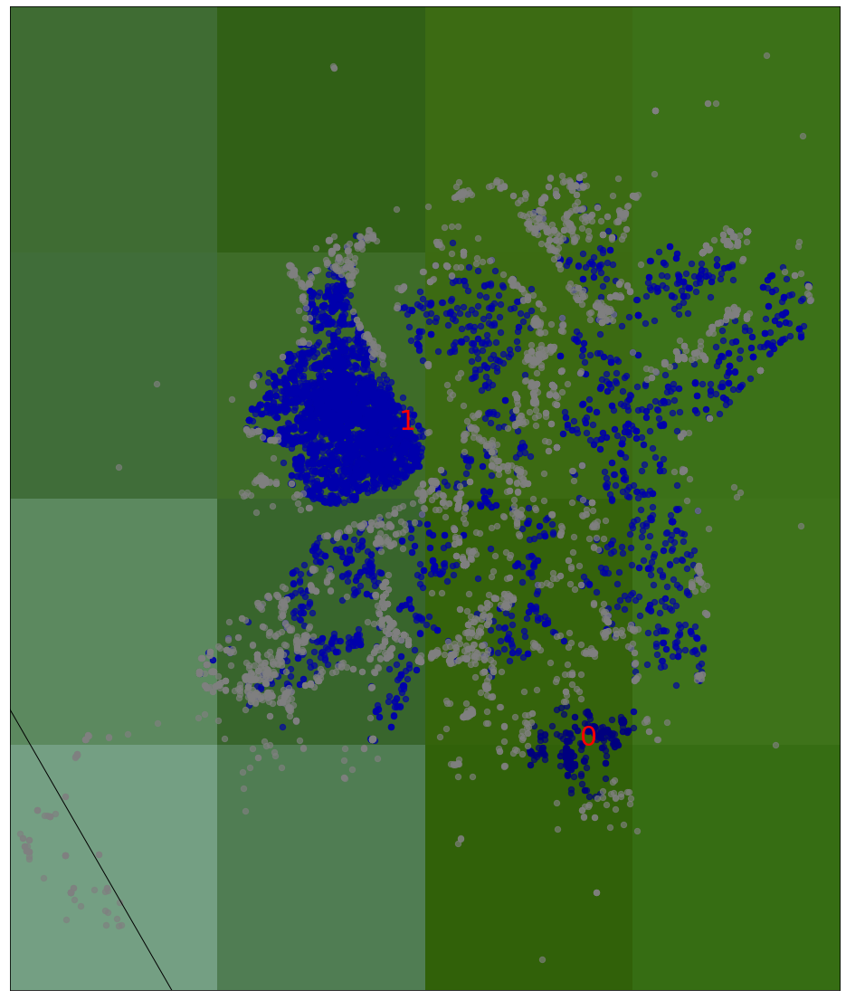

variance  0.0013987824962013466
variance  0.0013956245808226272
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[-1 -1  7 ...  7 -1  2]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
23036 2021-04-12  21.150412  ...           NaN       

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


330
Cluster 0, data points 330
6539
Cluster 1, data points 6539
3954


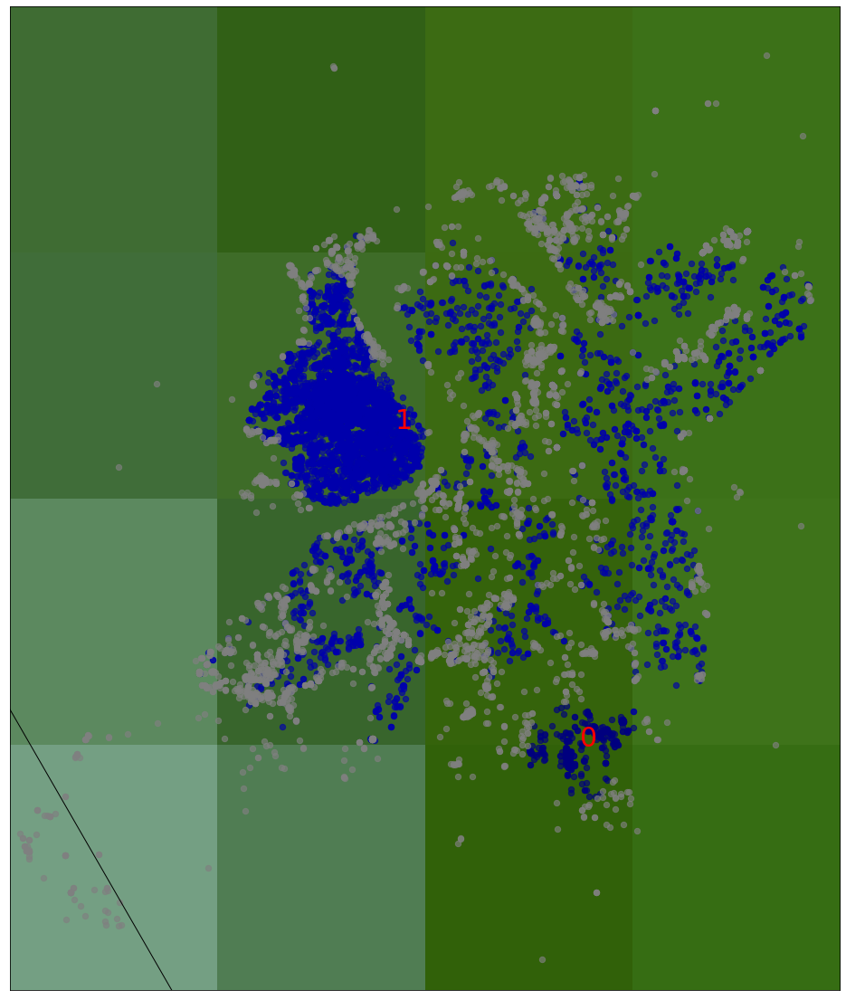

variance  0.0013524852555776038
variance  0.00134937547298422
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[4 4 4 ... 2 7 7]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
24885 2021-04-13  21.236509  ...           NaN           NaN


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


356
Cluster 0, data points 356
6844
Cluster 1, data points 6844
4334


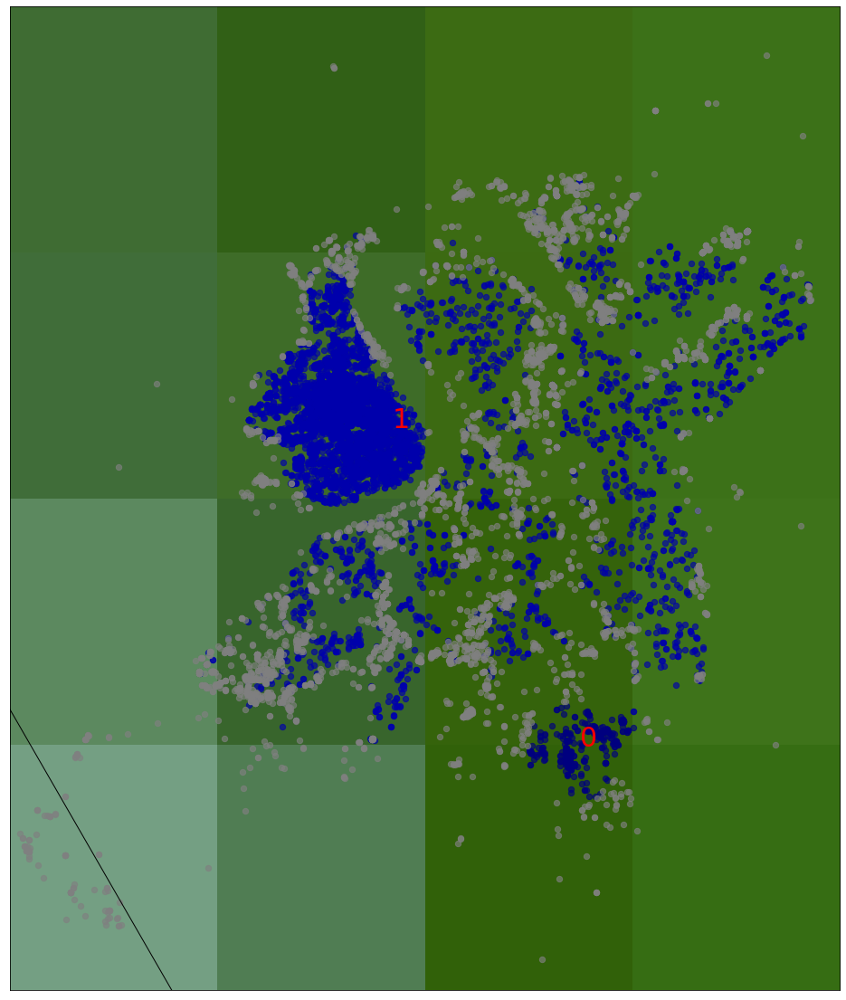

variance  0.0012862460600924167
variance  0.0012831825178568276
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 6  6  3 ...  1 -1  2]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
26782 2021-04-14  21.293729  ...           NaN       

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


378
Cluster 0, data points 378
7306
Cluster 1, data points 7306
4772


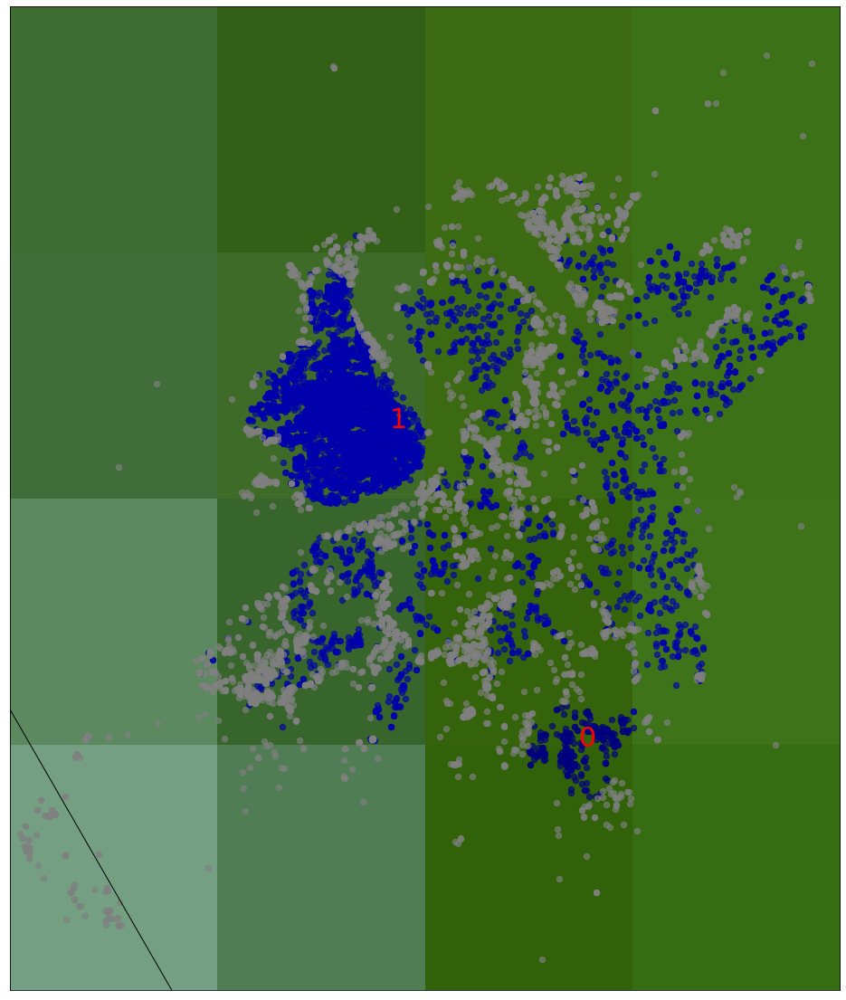

variance  0.0012879341496725488
variance  0.0012848197641886416
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 9  3 -1 ...  1  1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
28582 2021-04-15  21.170880  ...           NaN       

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


412
Cluster 0, data points 412
7652
Cluster 1, data points 7652
5146


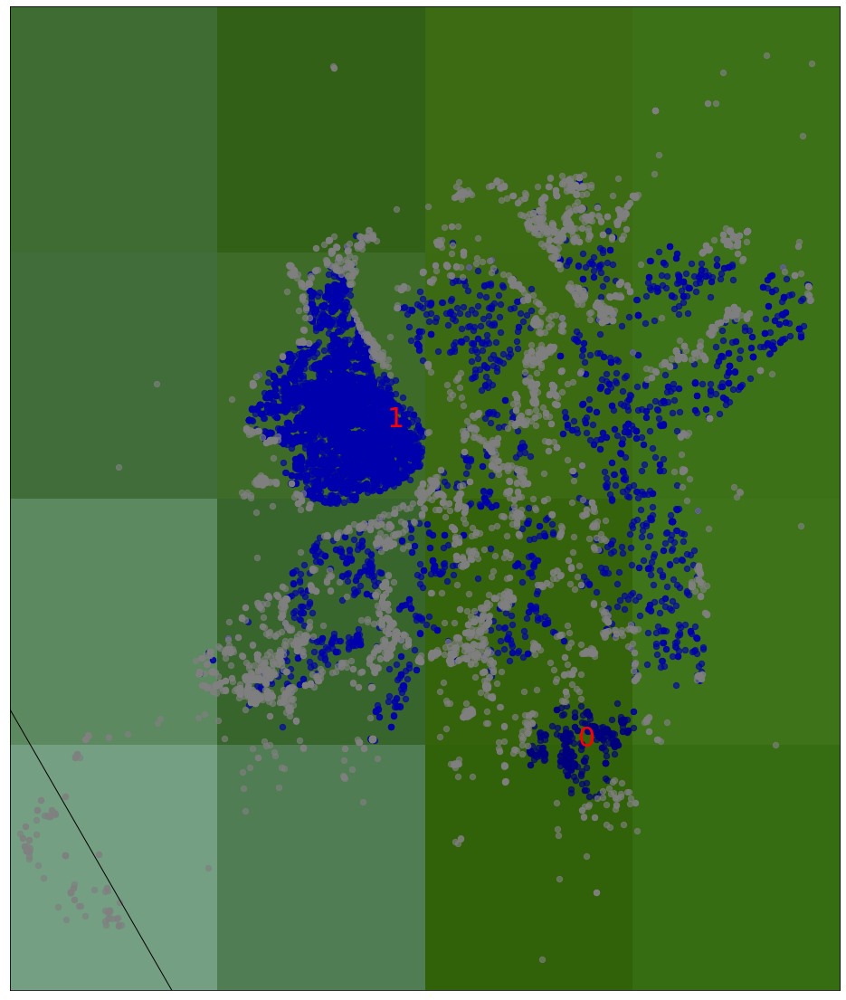

variance  0.0012639439377908333
variance  0.001260856757525419
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 4  4  4 -1  2  2  2  2 -1  3 -1 -1  4  5  5  5 -1  4  4  5 -1  4  4  9
  3  9  4 -1  9  2  9  4  4  4  3  4  5  4  4  4  4  4  9 -1 -1  3  2  5
  8  3  8  1  8 -1 -1  2  8 -1 -1  7 -1 -1 -1  9  9  9  3 -1 -1  2 -1  4
  2  2 -1  1  3 -1  4  3  6  4 -1 -1 -1  4  2  2 -1 -1  4  4  4  3  4 -1
  5 -1  3  2 -1 -1  3  4  1 -1 -1  4  3  2  2  2 -1  2  2  6  2  6  6  3
  6  8  3 -1  2  4  4  2  3  2  2 -1 -1  2  8  3  6 -1 -1  9  2  6  2  8
 -1  3  8  8 -1  8 -1  8 -1  8 -1  2  9  6 -1  4  8  2  2 -1  7  3 -1 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


412
Cluster 0, data points 412
7662
Cluster 1, data points 7662
5286


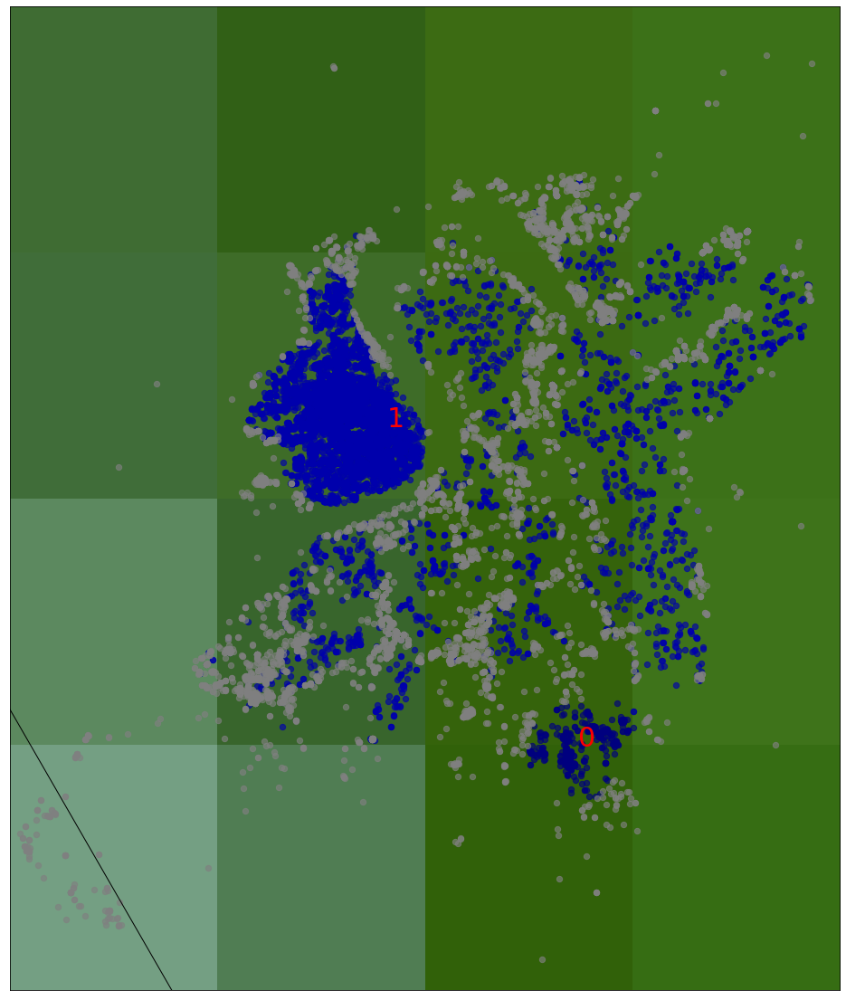

variance  0.0013516499481922213
variance  0.0013484478340223943
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None


In [33]:
#do the same procesure for subsequent dates 
#get predicted labels for the following dates and then check the variance 
for date in range(1, len(dates_list)):
  df_date_temp = dates_list[date]
  df_date_temp = get_dates_list(df,df_date_temp)
  pred_labels= get_predicted_labels(df_date_temp,hdb)
  df_date_temp['clus_hdb_labels'] = pred_labels
  df_list = [df_date,df_date_temp]
  df_date = pd.concat(df_list)
  clustername_date = len(set(df_date['clus_hdb_labels']))

  plot_map(df_date,hdb_labels,clustername_date)
  plt.show()
  print(variance_centroids(hdb,clustername_date,df_date))
  
  
  

[ 1  1  1 ...  1 -1  1]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
4553        NaT  21.163619  ...           NaN           NaN
4554        NaT  21.157665  ...           NaN           NaN
4555        NaT  21.165650  ...           NaN           NaN
4556        NaT  21.184863  ...           NaN           NaN
4557        NaT  21.146249  ...           NaN           NaN

[31384 rows x 6 columns]
527
Cluster 0, data points 527
9605
Cluster 1, data points 9605
5473


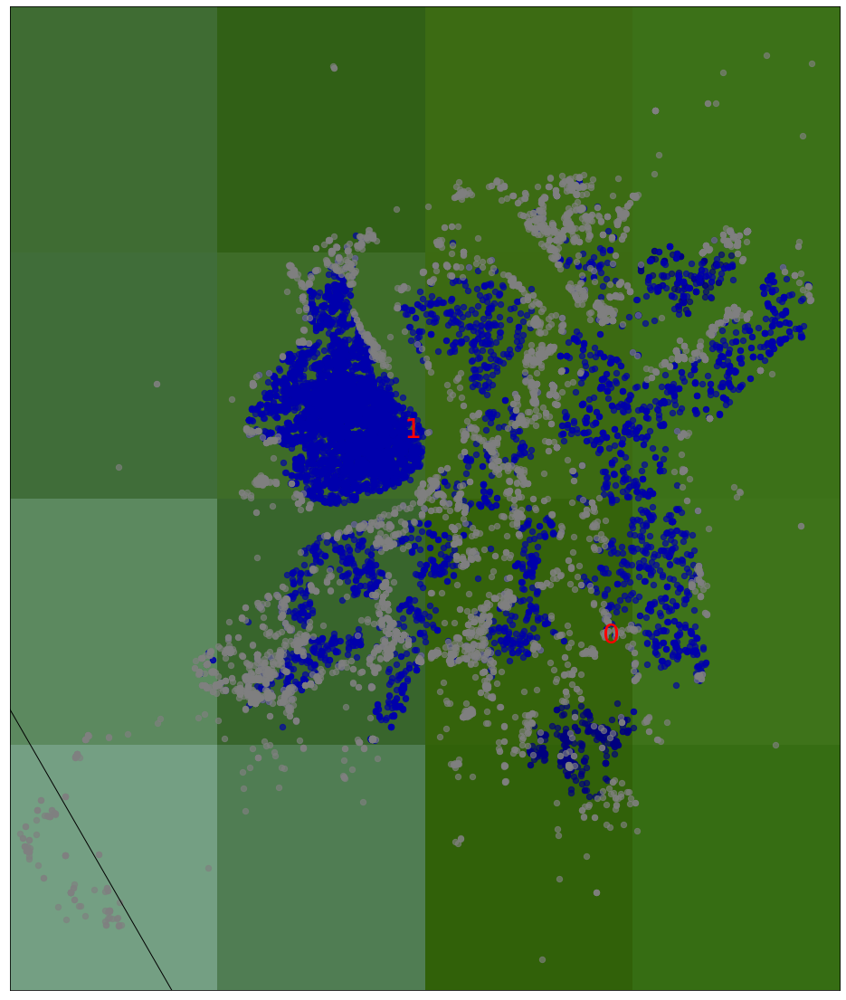

variance  0.0012814608151178546
variance  0.0012776070920882216
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 1  1  1 ... -1  1  0]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
7105        NaT  21.205525  ...           NaN           NaN


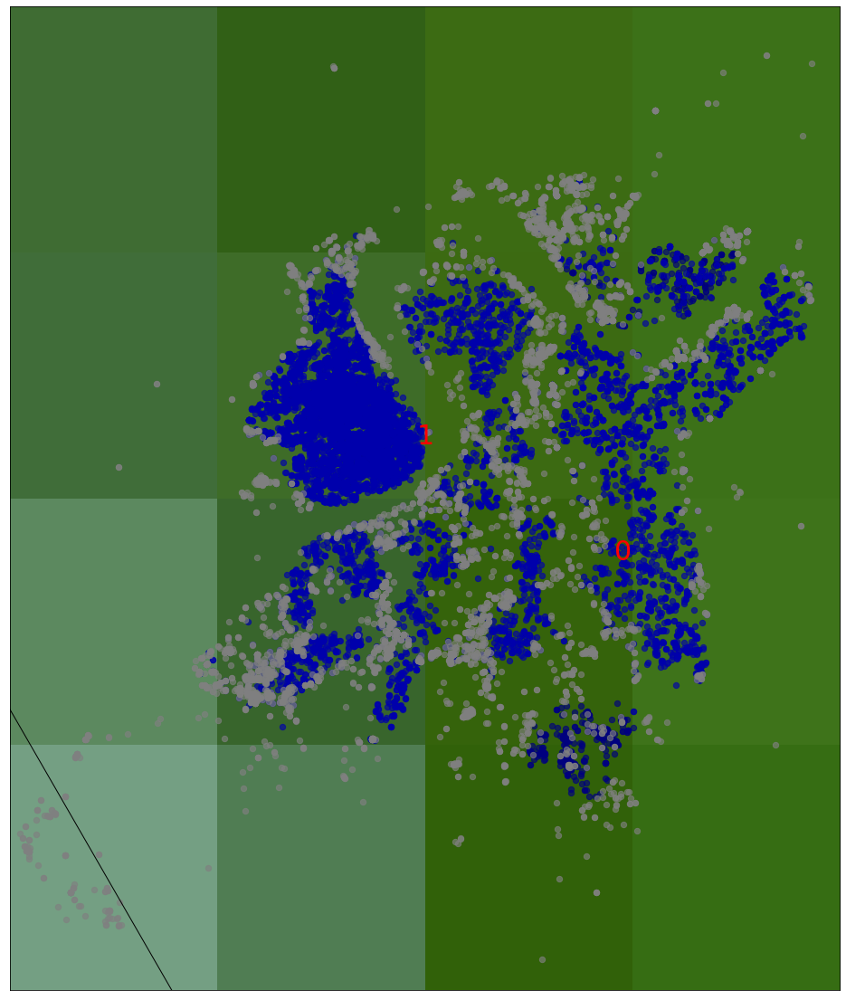

variance  0.0012825162774218115
variance  0.0012793607119669424
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[1 1 0 ... 0 1 1]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
9392        NaT  21.243340  ...           NaN           NaN
9393  

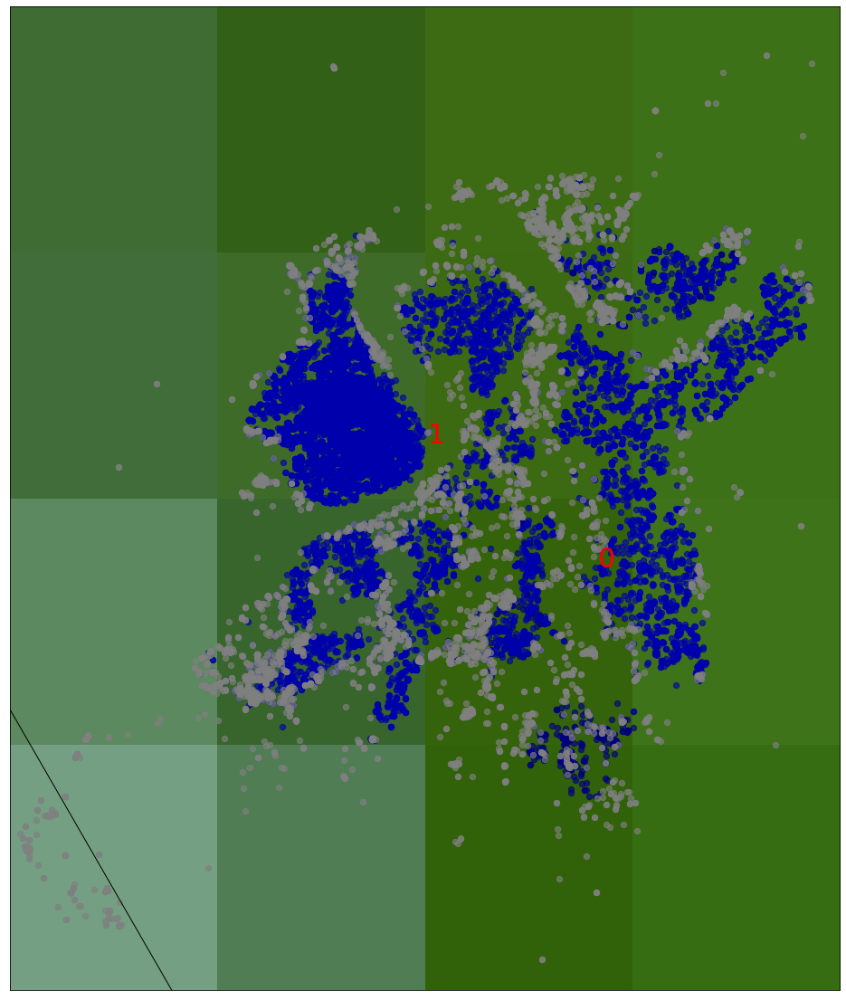

variance  0.0012680962378877672
variance  0.0012670548199626031
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[0 1 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
11685        NaT  21.223986  ...           NaN           Na

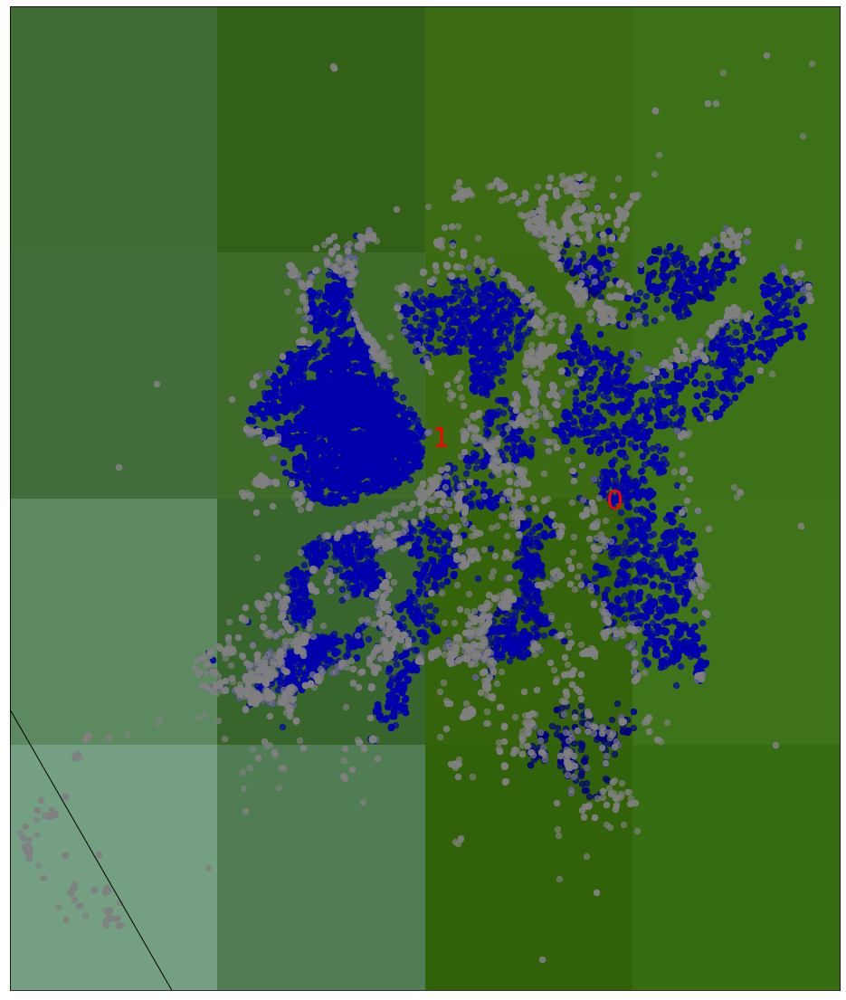

variance  0.0012364625195131196
variance  0.0012335852206958734
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[1 1 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
13870        NaT  21.244172  ...           NaN           Na

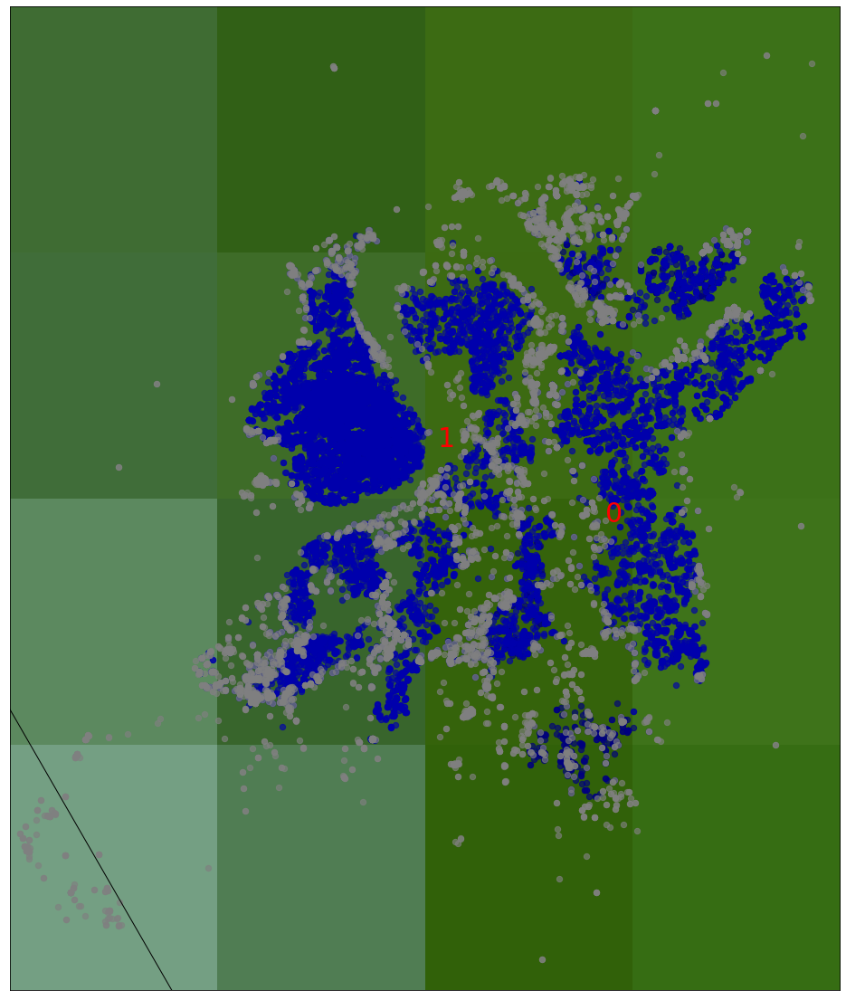

variance  0.0013108074134137418
variance  0.0013071795746139887
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[-1  0  0 ...  0  0  1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
16139        NaT  21.223474  ...           NaN       

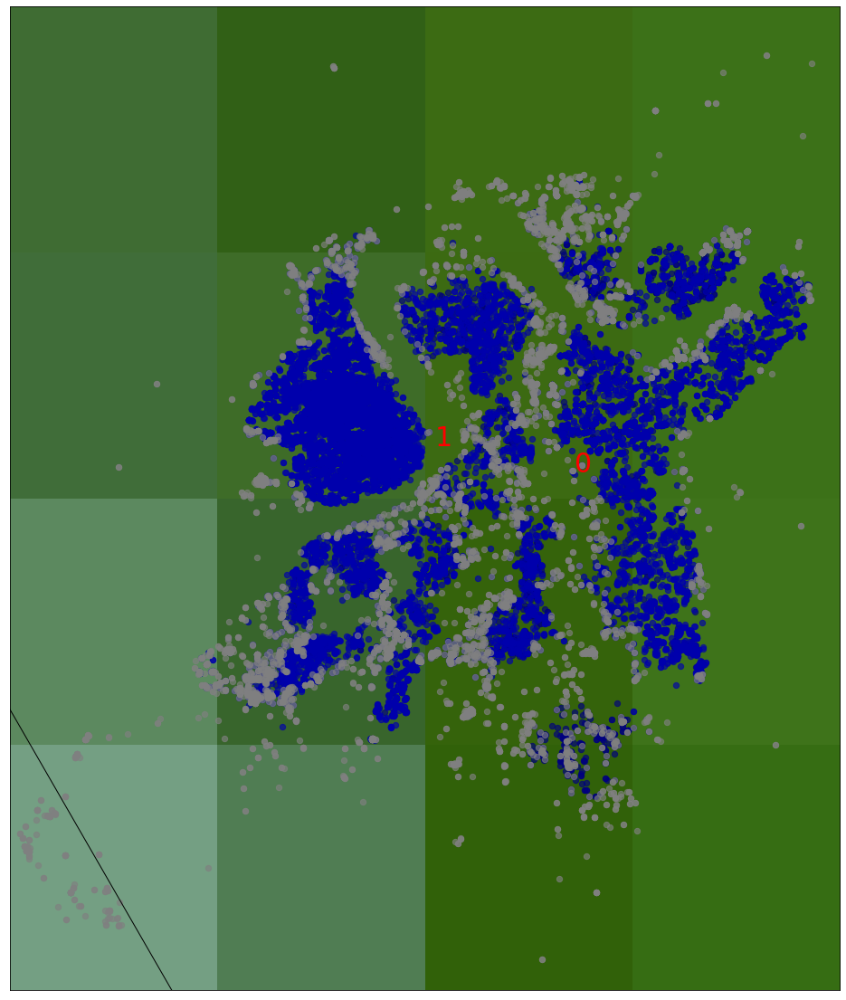

variance  0.001333733393170263
variance  0.0013314179627249981
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 1  0  1 ...  1  1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
18982        NaT  21.219969  ...           NaN        

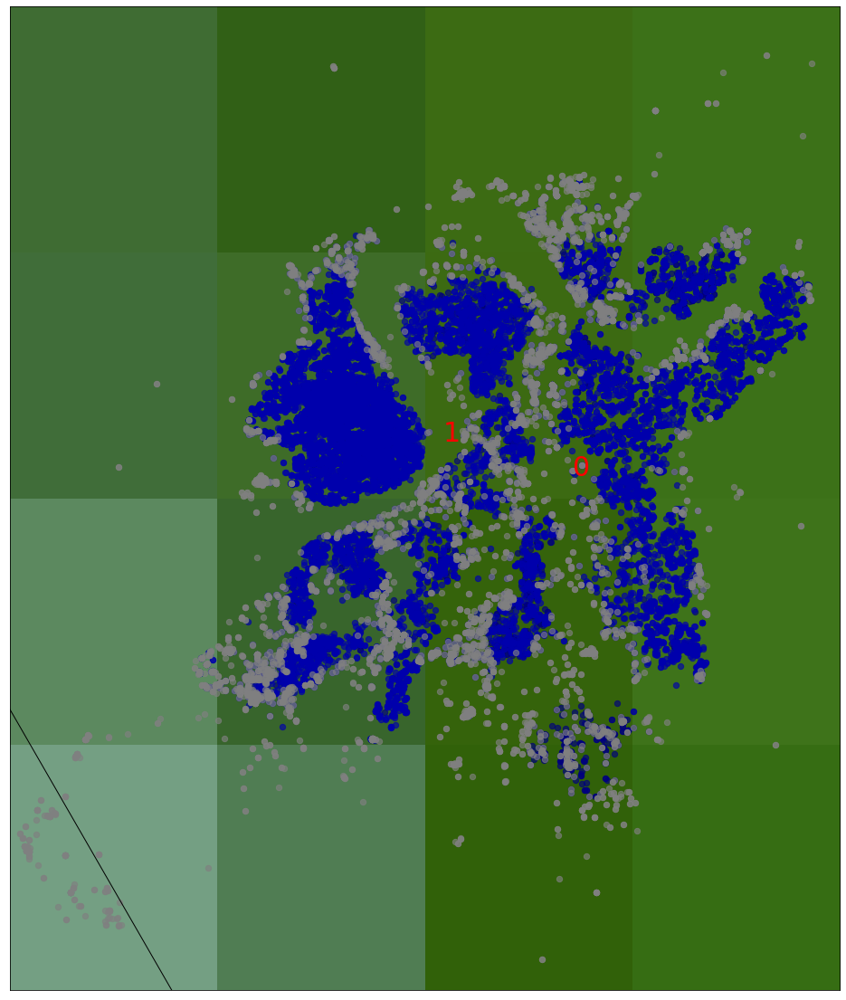

variance  0.0013414079423848362
variance  0.00134048229643144
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[1 0 0 ... 0 0 0]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
21106        NaT  21.221817  ...           NaN           NaN


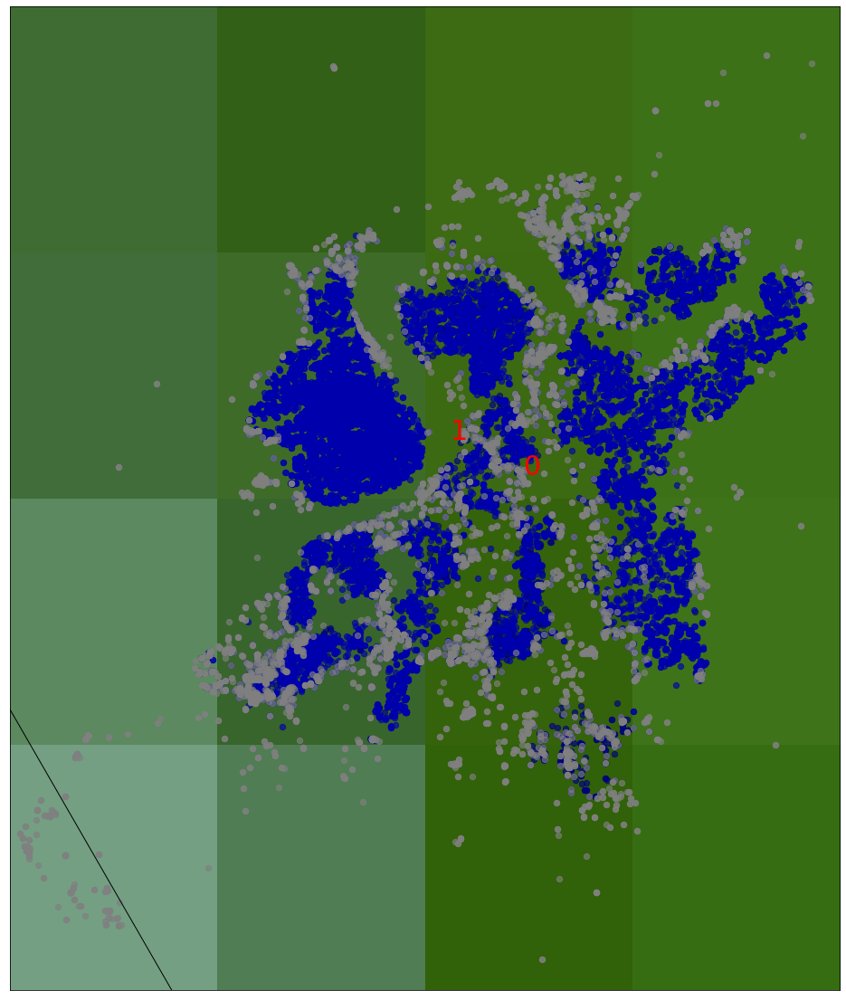

variance  0.001314162518653142
variance  0.0013177331757432682
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 1 -1  1 ...  1  1  1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
23036        NaT  21.150412  ...           NaN        

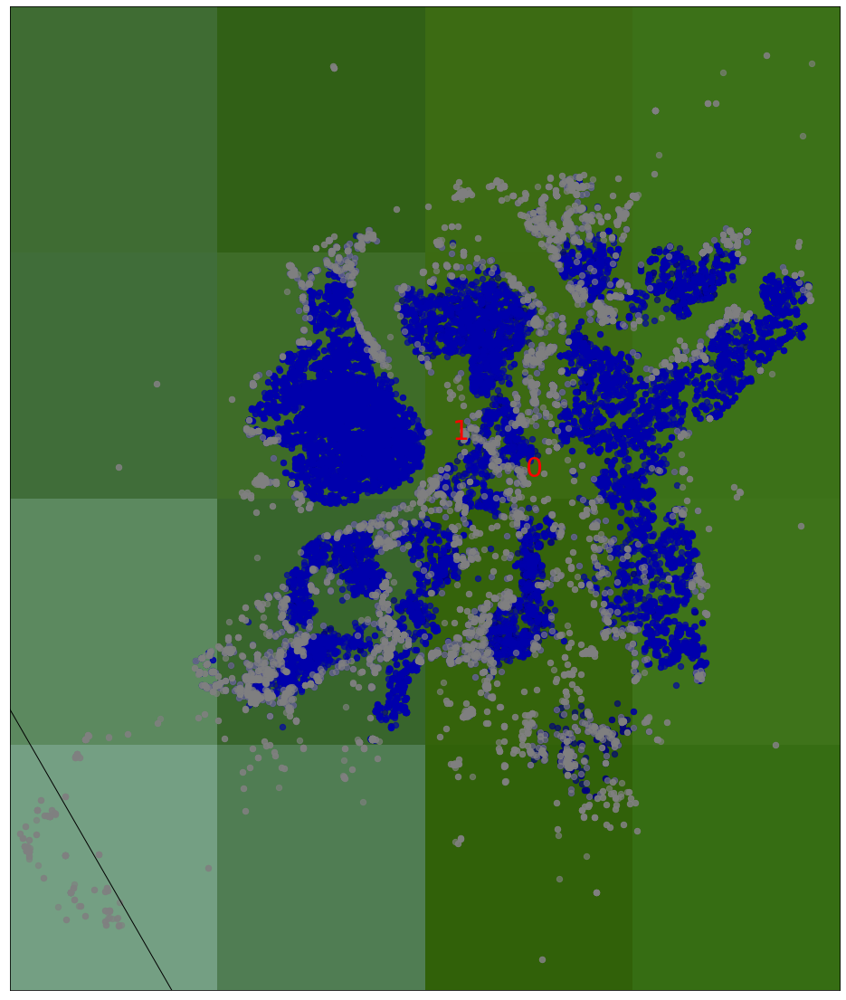

variance  0.0013001120313653925
variance  0.001296484962913195
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[1 1 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
24885        NaT  21.236509  ...           NaN           NaN

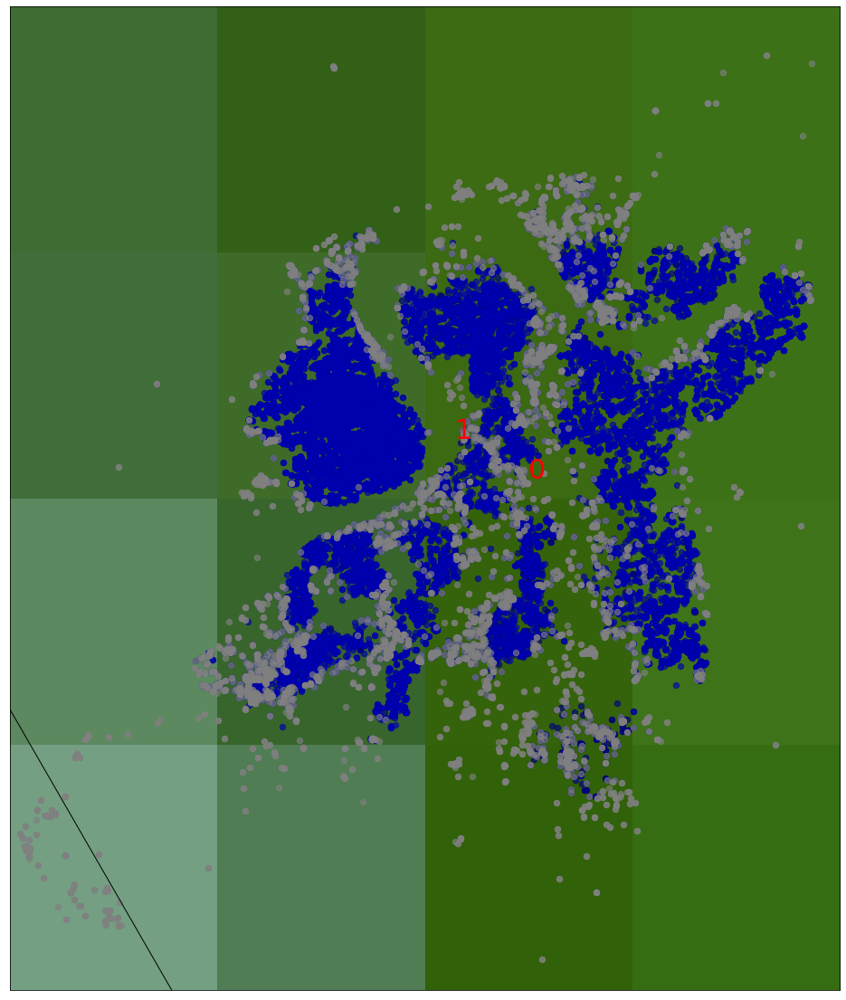

variance  0.0012702279741504357
variance  0.0012667337737287316
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 0  0  1 ...  0 -1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
26782        NaT  21.293729  ...           NaN       

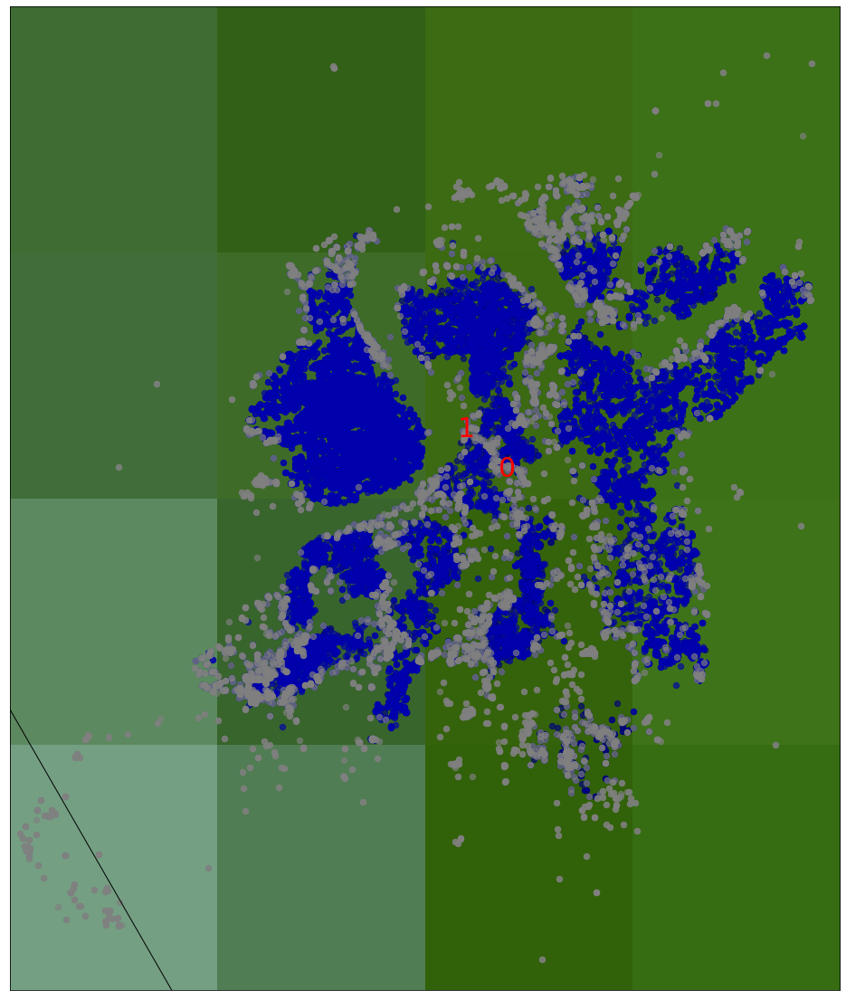

variance  0.0012672069717321705
variance  0.001270654488562103
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[1 0 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
28582        NaT  21.170880  ...           NaN           NaN

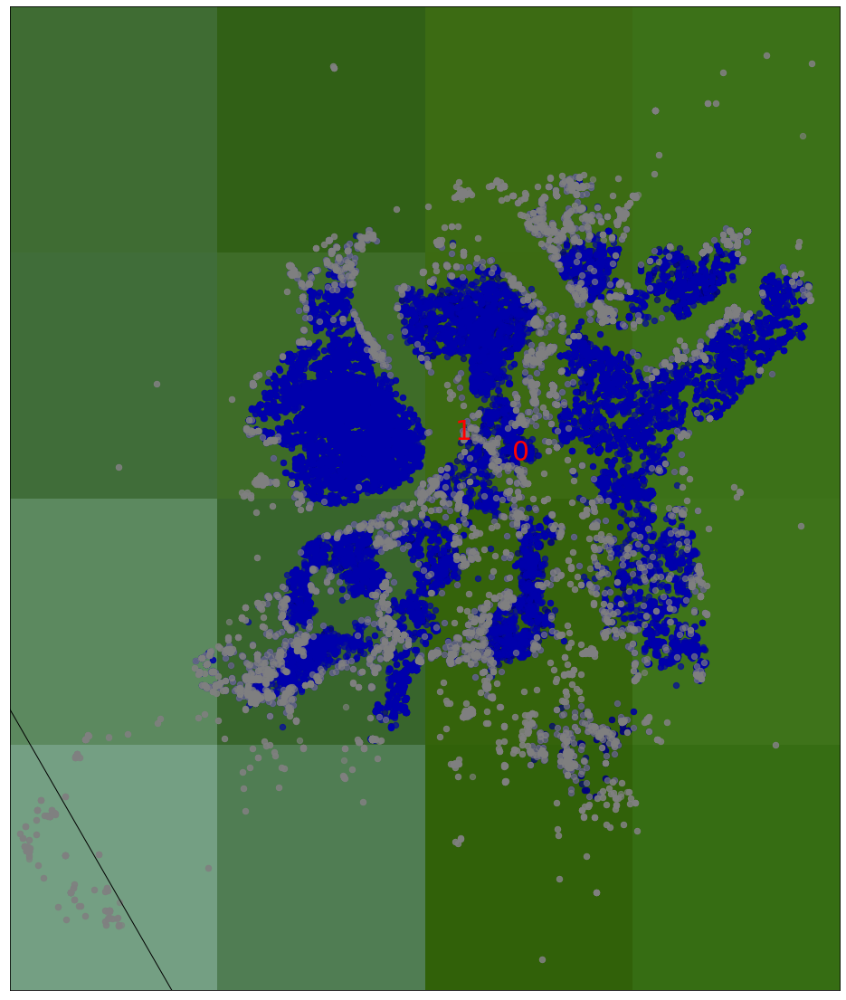

variance  0.001257967529170566
variance  0.001255331367334397
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None
[ 1  1  1 -1  0  0  0 -1 -1 -1 -1 -1  1  1  1  1 -1  1  1  1 -1  1  1  1
 -1  1  1  1  1 -1  1 -1 -1  1 -1  1  1  1  1  1 -1 -1  1  1  1 -1 -1  1
  1 -1  1 -1  1  1 -1  0  1 -1  1 -1  1  1  1  1  1  1 -1  1  1 -1  1  1
 -1  0 -1 -1 -1  1 -1 -1  1 -1 -1 -1  1  1 -1 -1  1 -1  1  1  1 -1  1 -1
  1 -1 -1 -1 -1  1 -1  1 -1  1  1  1 -1 -1  0  0 -1 -1  0  1  0  1  1  0
  1  1  0  1  0  1  1  0  0  0  0 -1  1  0  1  0  1  1  1  1  0  1  0  1
  1 -1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  0 -1 -1 -1 -1  1  

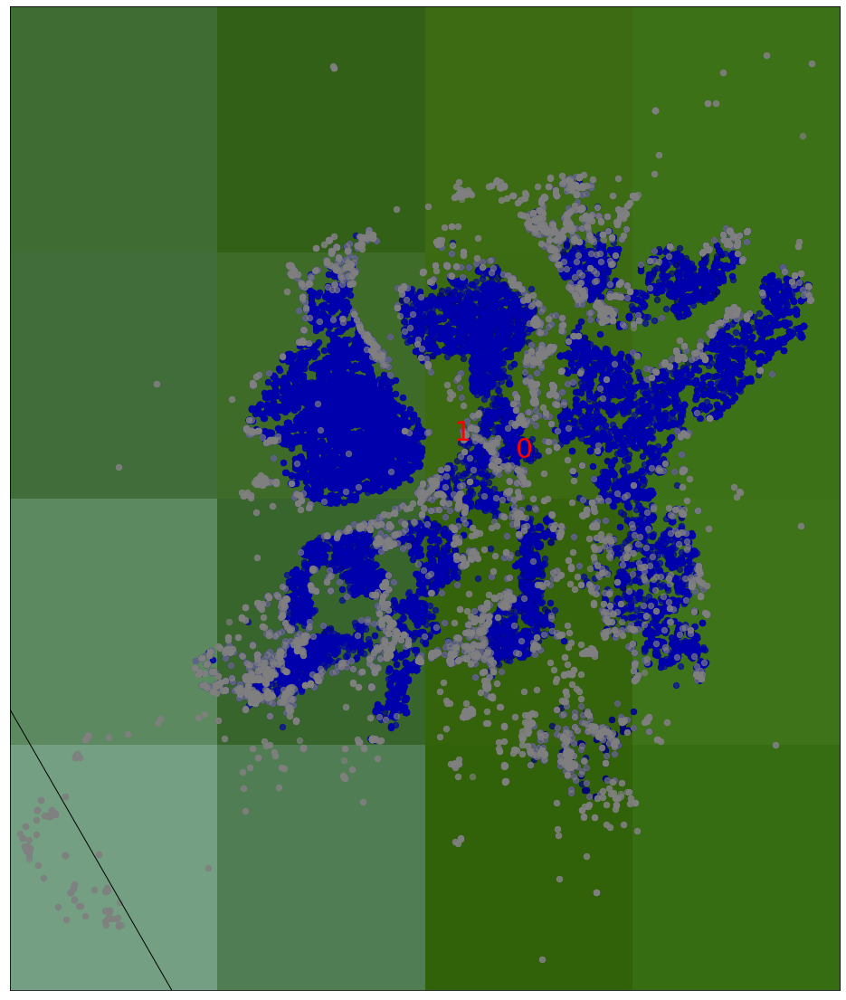

variance  0.001306019811626062
variance  0.0013012999978951312
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
Erro calculating the centroid for cluster no 7
Erro calculating the centroid for cluster no 8
Erro calculating the centroid for cluster no 9
Erro calculating the centroid for cluster no 10
None


In [34]:
for date in range(1, len(dates_list)):
  df_date_temp = dates_list[date]
  df_date_temp = get_dates_list(df,df_date_temp)
  df_date_temp = df_date_temp[["Latitude","Longitude"]]
  hdb_labels = hdb.fit_predict(np.radians(df_date_temp))
  print(hdb_labels)
  df_date_temp['clus_hdb_labels'] = hdb_labels
  df_list = [df_date,df_date_temp]
  df_date = pd.concat(df_list)
  clustername_date = len(set(df_date['clus_hdb_labels']))

  plot_map(df_date,hdb_labels,clustername_date)
  plt.show()
  print(variance_centroids(hdb,clustername_date,df_date))

<class 'pandas.core.frame.DataFrame'>
The relative validtiy of the clustering is 0.03480896185615787
df
           Date   Latitude  Longitude  clus_hdb_labels
0    2021-04-03  21.223025  72.808018                0
1    2021-04-03  21.169480  72.790440                0
2    2021-04-03  21.195021  72.798539                0
3    2021-04-03  21.134580  72.772360                0
4    2021-04-03  21.166400  72.814610                0
...         ...        ...        ...              ...
7105 2021-04-05  21.205525  72.872036                0
7106 2021-04-05  21.168800  72.834573                0
7107 2021-04-05  21.122881  72.847671                0
7108 2021-04-05  21.213431  72.889128                0
7109 2021-04-05  21.241242  72.880264                1

[7110 rows x 4 columns]
6484
Cluster 0, data points 6484
559
Cluster 1, data points 559
67


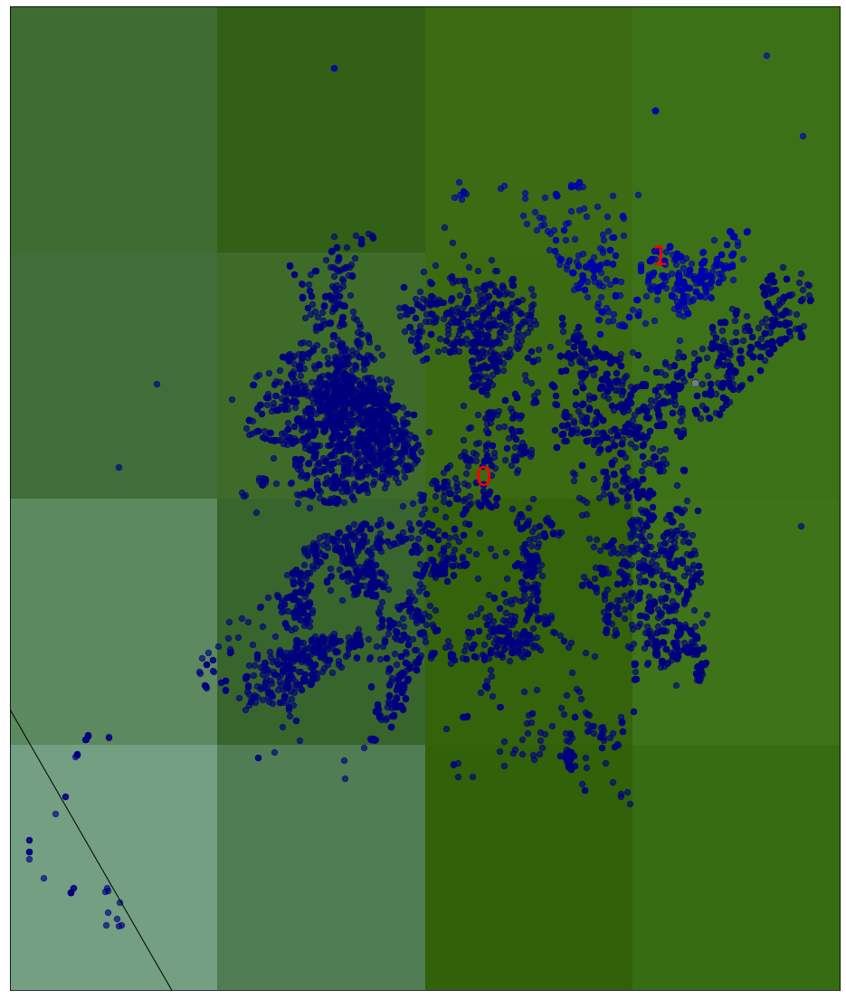

In [35]:
df_date = get_dates_list(df,dates_list[0])
df_date2 = get_dates_list(df,dates_list[1])
df_date3 = get_dates_list(df,dates_list[2])
df_date = pd.concat([df_date,df_date2,df_date3])
# print(len(df_date))
earth_radius = 6371
epsilon = 0.0003 #calculate 5 meter epsilon threshold
hdb, hdb_labels = hdbscan_model_epsilon(df_date,epsilon)

df_date["clus_hdb_labels"] = hdb_labels

label_hdb = list(set(hdb_labels))
# realclustername_date = len(set(labels_hdb))-(1 if -1 in labels_hdb else 0)
clustername_date = len(set(hdb_labels))

plot_map(df_date,hdb_labels,clustername_date)
plt.show()

In [52]:
print(len(df_date[df_date.clus_hdb_labels == 1].Latitude))
from mpl_toolkits.mplot3d import axes3d
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax = fig.gca(projection='3d')
my_cmap = plt.get_cmap('hsv')
for data,clusterno in zip(df_date,set(hdb_labels)):
  if clusterno ! = -1:
    c = color_cluster[cluster_no]
  else :
    c = 'grey'
  
  
for cluster_no in set(hdb_labels):
  if cluster_no != -1:
    c = color_cluster[cluster_no]
  else :
    c = 'grey'
  x = df_date[df_date.clus_hdb_labels == cluster_no].Latitude
  y = df_date[df_date.clus_hdb_labels == cluster_no].Longitude
  z = df_date[df_date.clus_hdb_labels == cluster_no].Date
  ax.scatter(x, y, z, alpha=0.8, edgecolors='none',cmap = my_cmap, s=30,label=set(hdb_labels))

plt.title('Matplot 3d scatter plot')
# plt.legend(loc=2)

ax.set_xlabel('Latitude Label')
ax.set_ylabel('Longitude Label')
ax.set_zlabel('Date Label')

plt.show()

559


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


ValueError: ignored

<Figure size 1800x1440 with 1 Axes>